## Import TensorFlow and other libraries

In [1]:
import outils
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
df = outils.Load_data.load_object("dataset2.zip")

In [3]:
df.reshape(target_shape=(64,64,3), batch_size = 32)

Reshape en batch: 100%|██████████| 380/380 [00:20<00:00, 18.56it/s]


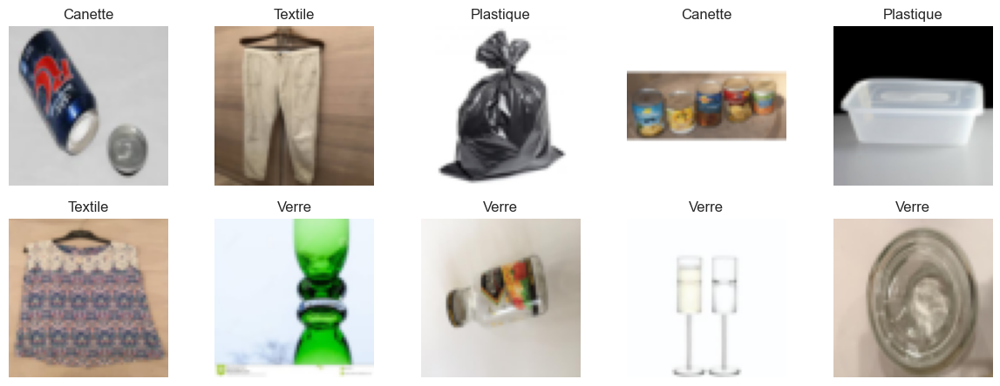

In [4]:
df.plot()

In [5]:
df.encodage()

In [6]:
(X_train, _), (X_test, _ ) = df.create_data(test_size=0.1)

In [7]:
print(f"X_train shape : {X_train.shape}")
print(f"X_test  shape : {X_test.shape}")

X_train shape : (10924, 64, 64, 3)
X_test  shape : (1214, 64, 64, 3)


In [8]:
X_vis = X_test[0:10]

In [9]:
X_vis = X_vis.astype("float32") / 255.

In [10]:
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    brightness_range=[0.9, 1.1],
    fill_mode='nearest',
    rescale=1./255
)


test_datagen =  ImageDataGenerator(rescale= 1. / 255)

In [11]:
train_generator = train_datagen.flow(X_train,X_train,batch_size=64)
test_generator  = test_datagen.flow(X_test,X_test,batch_size=64)

In [ ]:
#noise_adder = outils.NoiseAdder(X_train)

In [ ]:
#noisy_gaussian = noise_adder.apply("gaussian", std=0.2)

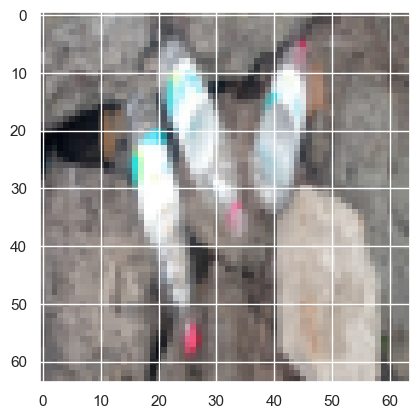

In [20]:
plt.imshow(X_test[8])

In [10]:
X_train = X_train.astype("float32") / 255.

In [11]:
X_test = X_test.astype("float32") / 255.

In [12]:
print(f"min = {np.min(X_test)} et max = {np.max(X_test)}")

min = 0.0 et max = 1.0


In [13]:
print(f"min = {np.min(X_train)} et max = {np.max(X_train)}")

min = 0.0 et max = 1.0


In [ ]:
plt.figure(figsize=(18,9))
for i in range(1,11):
    plt.subplot(4,5,i)
    plt.imshow(X_train[i])
    plt.title(y_train[i])
    plt.tight_layout()
plt.show()

In [14]:
import os 
import numpy as np
import json
import tensorflow as tf 
from tensorflow.keras import layers, models, losses, callbacks, regularizers
from sklearn.metrics import mean_squared_error
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler,ModelCheckpoint,ReduceLROnPlateau

In [16]:
from keras.saving import register_keras_serializable

In [ ]:
def ResidualBlock(filters, stride=1, use_bn=False, l2=1e-4):
    def f(x):
        shortcut = x
        y = layers.Conv2D(filters, 3, strides=stride, padding="same",
                          kernel_regularizer=tf.keras.regularizers.l2(l2), use_bias=not use_bn)(x)
        if use_bn: y = layers.BatchNormalization()(y)
        y = layers.Activation("relu")(y)

        y = layers.Conv2D(filters, 3, padding="same",
                          kernel_regularizer=tf.keras.regularizers.l2(l2), use_bias=not use_bn)(y)
        if use_bn: y = layers.BatchNormalization()(y)

        # Adapter raccourci
        if shortcut.shape[-1] != filters or stride != 1:
            shortcut = layers.Conv2D(filters, 1, strides=stride, padding="same",
                                     kernel_regularizer=tf.keras.regularizers.l2(l2),
                                     use_bias=not use_bn)(shortcut)
            if use_bn: shortcut = layers.BatchNormalization()(shortcut)

        out = layers.Add()([y, shortcut])
        out = layers.Activation("relu")(out)
        return out
    return f


# -----------------------------
# Bloc résiduel upsampling
# -----------------------------
def ResidualBlockUp(filters, scale=2, use_bn=False, l2=1e-4):
    def f(x):
        shortcut = x
        y = layers.UpSampling2D(size=(scale, scale))(x)
        y = layers.Conv2D(filters, 3, padding="same",
                          kernel_regularizer=tf.keras.regularizers.l2(l2), use_bias=not use_bn)(y)
        if use_bn: y = layers.BatchNormalization()(y)
        y = layers.Activation("relu")(y)

        y = layers.Conv2D(filters, 3, padding="same",
                          kernel_regularizer=tf.keras.regularizers.l2(l2), use_bias=not use_bn)(y)
        if use_bn: y = layers.BatchNormalization()(y)

        shortcut = layers.UpSampling2D(size=(scale, scale))(shortcut)
        shortcut = layers.Conv2D(filters, 1, padding="same",
                                 kernel_regularizer=tf.keras.regularizers.l2(l2),
                                 use_bias=not use_bn)(shortcut)
        if use_bn: shortcut = layers.BatchNormalization()(shortcut)

        out = layers.Add()([y, shortcut])
        out = layers.Activation("relu")(out)
        return out
    return f


# -----------------------------
# Échantillonnage
# -----------------------------
@register_keras_serializable()
class Sampling(layers.Layer):
    def call(self, inputs):
        z_mean, z_logvar = inputs
        eps = tf.random.normal(shape=tf.shape(z_mean))
        return z_mean + tf.exp(0.5 * z_logvar) * eps


# -----------------------------
def build_encoder(input_shape=(240, 240, 3), latent_dim=128, base=32):
    inp = layers.Input(shape=input_shape)
    x = inp

    # downsampling avec blocs résiduels
    x = layers.Conv2D(base, 3, padding="same")(x)
    x = layers.Activation("relu")(x)

    x = ResidualBlock(base,   stride=1)(x)  # HxW
    x = ResidualBlock(base*2, stride=2)(x)  # H/2 x W/2
    x = ResidualBlock(base*2, stride=1)(x)
    x = ResidualBlock(base*4, stride=2)(x)  # H/4 x W/4
    x = ResidualBlock(base*4, stride=1)(x)
    x = ResidualBlock(base*8, stride=2)(x)  # H/8 x W/8
    x = ResidualBlock(base*8, stride=1)(x)

    x = layers.GlobalAveragePooling2D()(x)
    
    # PAS de Dense intermédiaire !
    z_mean   = layers.Dense(latent_dim, name="z_mean")(x)
    z_logvar = layers.Dense(latent_dim, name="z_logvar")(x)
    z = Sampling()([z_mean, z_logvar])

    return tf.keras.Model(inp, [z_mean, z_logvar, z], name="encoder")

def build_decoder(output_shape=(240, 240, 3), latent_dim=128, base=32):
    H, W, C = output_shape
    h0, w0 = H // 8, W // 8
    
    inp = layers.Input(shape=(latent_dim,))
    x = layers.Dense(h0 * w0 * base*8, activation="relu")(inp)
    x = layers.Reshape((h0, w0, base*8))(x)

    x = ResidualBlock(base*8, stride=1)(x)
    x = ResidualBlockUp(base*4)(x)
    x = ResidualBlock(base*4, stride=1)(x)
    x = ResidualBlockUp(base*2)(x)
    x = ResidualBlock(base*2, stride=1)(x)
    x = ResidualBlockUp(base)(x)
    x = ResidualBlock(base, stride=1)(x)

    # IMPORTANT: Pas d'activation sigmoid ici (on veut des logits)
    out = layers.Conv2D(C, 3, padding="same")(x)  # Pas d'activation !
    return tf.keras.Model(inp, out, name="decoder")


# -----------------------------
# Callback pour affichage reconstruction
# -----------------------------
class PlotReconstructionCallback(tf.keras.callbacks.Callback):
    def __init__(self, model, x_vis):
        super().__init__()
        self.vae_model = model
        self.x_vis = x_vis.astype("float32")
        
        # Si les images sont en [0,255], normaliser
        if self.x_vis.max() > 1.0:
            self.x_vis = self.x_vis / 255.0

    def on_epoch_end(self, epoch, logs=None):
        # Inférence
        mean, logvar = self.vae_model.encode(self.x_vis)
        z = self.vae_model.reparameterize(mean, logvar)
        recon_logits = self.vae_model.decode(z)
        recon = tf.nn.sigmoid(recon_logits)  # Application de sigmoid pour visualisation
        
        n = min(5, len(self.x_vis))
        plt.figure(figsize=(20, 8))
        for i in range(n):
            # Original
            plt.subplot(2, n, i + 1)
            plt.imshow(np.clip(self.x_vis[i], 0, 1))
            plt.axis("off")
            plt.title("Original")

            # Reconstruit
            plt.subplot(2, n, n + i + 1)
            plt.imshow(np.clip(recon[i], 0, 1))
            plt.axis("off")
            plt.title(f"Reconstruit (KL: {logs.get('kl_loss', 0):.1f})")
        
        plt.suptitle(f"Époque {epoch + 1}")
        plt.tight_layout()
        plt.show()

class SaveHistoryCallback(tf.keras.callbacks.Callback):
    def __init__(self, save_dir="training_checkpoint"):
        super().__init__()
        self.save_dir = save_dir
        os.makedirs(save_dir, exist_ok=True)
        self.history = {}

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        # Mettre à jour l'historique
        for k, v in logs.items():
            self.history.setdefault(k, []).append(float(v))

        # Sauvegarde de l’historique JSON
        history_path = os.path.join(self.save_dir, "history.json")
        with open(history_path, "w") as f:
            json.dump(self.history, f)

        # Sauvegarde de l'époque actuelle
        epoch_path = os.path.join(self.save_dir, "epoch.txt")
        with open(epoch_path, "w") as f:
            f.write(str(epoch + 1))  # +1 car epoch commence à 0


@register_keras_serializable()
class ResidualVAE(tf.keras.Model):
    def __init__(
        self, 
        encoder, 
        decoder, 
        beta=0.001,
        add_noise=True,          # <-- activer/désactiver le bruit
        noise_std=0.2,           # <-- intensité du bruit gaussien
        dropout_rate=0.0,        # <-- dropout aléatoire optionnel
        **kwargs
    ):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.beta = beta

        self.add_noise = add_noise
        self.noise_std = noise_std
        self.dropout_rate = dropout_rate

        self.total_loss_tracker = tf.keras.metrics.Mean(name="loss")
        self.recon_loss_tracker = tf.keras.metrics.Mean(name="recon_loss")
        self.kl_loss_tracker = tf.keras.metrics.Mean(name="kl_loss")

        self.log2pi = tf.math.log(2. * np.pi)


    # Pour la sérialisation Keras
    def get_config(self):
        config = super().get_config()
        config.update({
            "beta": self.beta,
            "add_noise": self.add_noise,
            "noise_std": self.noise_std,
            "dropout_rate": self.dropout_rate,
            "encoder": tf.keras.utils.serialize_keras_object(self.encoder),
            "decoder": tf.keras.utils.serialize_keras_object(self.decoder),
        })
        return config

    @classmethod
    def from_config(cls, config):
        encoder = tf.keras.utils.deserialize_keras_object(config.pop("encoder"))
        decoder = tf.keras.utils.deserialize_keras_object(config.pop("decoder"))
        return cls(encoder=encoder, decoder=decoder, **config)


    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.recon_loss_tracker,
            self.kl_loss_tracker,
        ]

    
    def encode(self, x):
        z_mean, z_logvar, _ = self.encoder(x, training=True)
        return z_mean, z_logvar
    
    def reparameterize(self, mean, logvar):
        eps = tf.random.normal(shape=tf.shape(mean))
        return mean + tf.exp(0.5 * logvar) * eps
    
    def decode(self, z):
        return self.decoder(z, training=True)
    
    def log_normal_pdf(self, sample, mean, logvar, raxis=1):
        return tf.reduce_sum(
            -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + self.log2pi),
            axis=raxis
        )

    def compute_loss(self, x_train, x_val=None):
        mean, logvar = self.encode(x_train)
        z = self.reparameterize(mean, logvar)
        x_logit = self.decode(z)  
        cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x_val)
        logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
        logpz = self.log_normal_pdf(z, 0., 0.)  
        logqz_x = self.log_normal_pdf(z, mean, logvar)
        kl_loss = logqz_x - logpz
        total_loss = -tf.reduce_mean(logpx_z - self.beta * kl_loss)
        recon_loss = -tf.reduce_mean(logpx_z)
        mean_kl = tf.reduce_mean(kl_loss)
        
        return total_loss, recon_loss, mean_kl
    # ------------------------
    # Fonction pour ajouter du bruit
    # ------------------------
    def add_training_noise(self, x):
        if not self.add_noise:
            return x

        # Bruit gaussien
        x_noisy = x + tf.random.normal(
            shape=tf.shape(x),
            mean=0.0,
            stddev=self.noise_std
        )

        # Dropout (optionnel)
        if self.dropout_rate > 0.0:
            x_noisy = tf.nn.dropout(x_noisy, rate=self.dropout_rate)

        # Clamp entre 0–1
        x_noisy = tf.clip_by_value(x_noisy, 0.0, 1.0)

        return x_noisy


    # ------------------------
    # TRAIN STEP MODIFIÉ
    # ------------------------
    def train_step(self, data):
        if isinstance(data, (tuple, list)):
            x_train = data[0]
            x_val = data[1] if len(data) > 1 else None

        else:
            x_train = data
            x_val = data
        
        x_noisy = self.add_training_noise(x_train)
        
        with tf.GradientTape() as tape:
            total_loss, recon_loss, kl_loss = self.compute_loss(x_noisy, x_val=x_val)
        
        gradients = tape.gradient(total_loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))

         # Mise à jour des métriques
        self.total_loss_tracker.update_state(total_loss)
        self.recon_loss_tracker.update_state(recon_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        
        return {
            "loss": self.total_loss_tracker.result(),
            "recon_loss": self.recon_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }
    # ------------------------
    # TEST STEP (sans bruit)
    # ------------------------
    def test_step(self, data):
        
        if isinstance(data, (tuple, list)):
            x = data[0]
        else:
            x = data
        
        total_loss, recon_loss, kl_loss = self.compute_loss(x,x_val=x)
        
    
        self.total_loss_tracker.update_state(total_loss)
        self.recon_loss_tracker.update_state(recon_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        
        return {
            "loss": self.total_loss_tracker.result(),
            "recon_loss": self.recon_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

    def call(self, x):
        
        mean, logvar = self.encode(x)
        z = self.reparameterize(mean, logvar)
        return self.decode(z)
    
    def train(
        self, x_train, x_val=None, batch_size=32, epochs=100, x_vis=None, save_path="residual_vae.keras",
         save_dir="training_checkpoint", initial_epoch=0,
    ):
        self.compile(optimizer=Adam(learning_rate=1e-3))

        callbacks_list = [
            SaveHistoryCallback(save_dir=save_dir),
            tf.keras.callbacks.EarlyStopping(
                monitor="val_loss", patience=80, restore_best_weights=True
            ),
            tf.keras.callbacks.ModelCheckpoint(save_path,monitor="val_recon_loss",verbose=1,save_best_only=True,mode="min"),
            tf.keras.callbacks.ReduceLROnPlateau(
                monitor="val_loss", factor=0.5, patience=10, verbose=1, min_lr=1e-7
            ),
        ]

        if x_vis is not None:
            callbacks_list.append(PlotReconstructionCallback(self, x_vis))

        history = self.fit(
            x_train,
            validation_data=x_val if x_val is not None else None,
            epochs=epochs,
            batch_size=batch_size,
            callbacks=callbacks_list,
            shuffle=True,
        )
        return history

In [18]:
input_shape = (64, 64, 3)   
latent_dim = 256

encoder = build_encoder(input_shape=input_shape, latent_dim=latent_dim, base=32)
decoder = build_decoder(output_shape=input_shape, latent_dim=latent_dim, base=32)

In [24]:
encoder.summary()

Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_36 (Conv2D)  │ (None, 64, 64,    │        896 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_29       │ (None, 64, 64,    │          0 │ conv2d_36[0][0]   │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_37 (Conv2D)  │ (None, 64, 64,    │      9,248 │ activation_29[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_30       │ (None, 64, 64,    │          0 │ conv2d_37[0][0]   │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_38 (Conv2D)  │ (None, 64, 64,    │      9,248 │ activation_30[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_14 (Add)        │ (None, 64, 64,    │          0 │ conv2d_38[0][0],  │
│                     │ 32)               │            │ activation_29[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_31       │ (None, 64, 64,    │          0 │ add_14[0][0]      │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_39 (Conv2D)  │ (None, 32, 32,    │     18,496 │ activation_31[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_32       │ (None, 32, 32,    │          0 │ conv2d_39[0][0]   │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_40 (Conv2D)  │ (None, 32, 32,    │     36,928 │ activation_32[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_41 (Conv2D)  │ (None, 32, 32,    │      2,112 │ activation_31[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_15 (Add)        │ (None, 32, 32,    │          0 │ conv2d_40[0][0],  │
│                     │ 64)               │            │ conv2d_41[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_33       │ (None, 32, 32,    │          0 │ add_15[0][0]      │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_42 (Conv2D)  │ (None, 32, 32,    │     36,928 │ activation_33[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_34       │ (None, 32, 32,    │          0 │ conv2d_42[0][0]   │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_43 (Conv2D)  │ (None, 32, 32,    │     36,928 │ activation_34[0]

 Total params: 2,905,728 (11.08 MB)

 Trainable params: 2,905,728 (11.08 MB)

 Non-trainable params: 0 (0.00 B)

In [25]:
decoder.summary()

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 256)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 16384)     │  4,210,688 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_1 (Reshape) │ (None, 8, 8, 256) │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_54 (Conv2D)  │ (None, 8, 8, 256) │    590,080 │ reshape_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_44       │ (None, 8, 8, 256) │          0 │ conv2d_54[0][0]   │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_55 (Conv2D)  │ (None, 8, 8, 256) │    590,080 │ activation_44[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_21 (Add)        │ (None, 8, 8, 256) │          0 │ conv2d_55[0][0],  │
│                     │                   │            │ reshape_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_45       │ (None, 8, 8, 256) │          0 │ add_21[0][0]      │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_6     │ (None, 16, 16,    │          0 │ activation_45[0]… │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_56 (Conv2D)  │ (None, 16, 16,    │    295,040 │ up_sampling2d_6[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_46       │ (None, 16, 16,    │          0 │ conv2d_56[0][0]   │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_7     │ (None, 16, 16,    │          0 │ activation_45[0]… │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 16, 16,    │    147,584 │ activation_46[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 16, 16,    │     32,896 │ up_sampling2d_7[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_22 (Add)        │ (None, 16, 16,    │          0 │ conv2d_57[0][0],  │
│                     │ 128)              │            │ conv2d_58[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_47       │ (None, 16, 16,    │          0 │ add_22[0][0]      │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_59 (Conv2D)  │ (None, 16, 16,    │    147,584 │ activation_47[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_48       │ (None, 16, 16,    │          0 │ conv2d_59[0][0]   │
│ (Activation)        │ 128)              │            │                 

 Total params: 6,403,523 (24.43 MB)

 Trainable params: 6,403,523 (24.43 MB)

 Non-trainable params: 0 (0.00 B)

In [22]:
import matplotlib.pyplot as plt

def plot_result(history, metrics=None, name_fig="fig", register=False):
    # Dictionnaire contenant toutes les métriques
    hist = history.history  

    # Si metrics n’est pas fourni, on prend toutes les clés
    if metrics is None:
        metrics = [m for m in hist.keys() if not m.startswith("val_")]

    n = len(metrics)
    fig, axes = plt.subplots(1, n, figsize=(6*n, 5))

    if n == 1:
        axes = [axes]  # uniformiser

    for i, metric in enumerate(metrics):
        ax = axes[i]
        ax.plot(hist[metric], label=f"Train {metric}")
        if f"val_{metric}" in hist:
            ax.plot(hist[f"val_{metric}"], label=f"Val {metric}")
        ax.set_title(metric.capitalize())
        ax.set_xlabel("Epochs")
        ax.set_ylabel(metric)
        ax.legend()
        ax.grid(True)

    plt.tight_layout()
    if register:
        plt.savefig(f"{name_fig}.png")
    plt.show()

In [19]:
from tensorflow.keras.models import load_model

In [20]:
model1 = load_model("model_dct_7.keras", custom_objects={"ResidualVAE": ResidualVAE, "Sampling": Sampling})

C:\Users\hp\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 2 variables whereas the saved optimizer has 116 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [19]:
autoencoder = ResidualVAE(
    encoder,
    decoder,
    beta=0.01,  
    add_noise=True,  
    noise_std=0.05,   
    dropout_rate=0.05 
)

In [24]:
save_dir = "training_checkpoint"

# Charger historique
history_path = os.path.join(save_dir, "history.json")
if os.path.exists(history_path):
    with open(history_path, "r") as f:
        history_old = json.load(f)
else:
    history_old = {}

# Charger epoch
epoch_path = os.path.join(save_dir, "epoch.txt")
if os.path.exists(epoch_path):
    with open(epoch_path, "r") as f:
        start_epoch = int(f.read())
else:
    start_epoch = 0


Epoch 1/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 619ms/step - kl_loss: 702.0488 - loss: 6153.8306 - recon_loss: 6146.8105
Epoch 1: val_recon_loss improved from None to 6008.73730, saving model to model_dct_9.keras


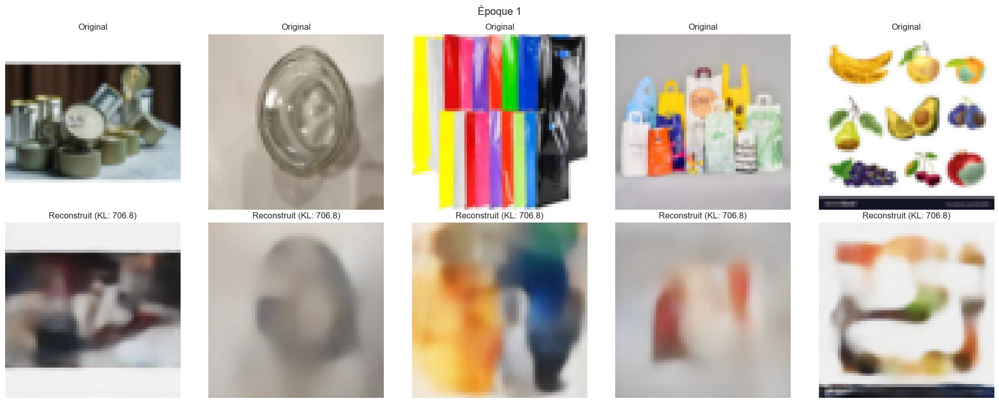

683/683 ━━━━━━━━━━━━━━━━━━━━ 451s 646ms/step - kl_loss: 706.7715 - loss: 6142.0498 - recon_loss: 6134.9829 - val_kl_loss: 706.9335 - val_loss: 6015.8086 - val_recon_loss: 6008.7373 - learning_rate: 0.0010
Epoch 2/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 662ms/step - kl_loss: 708.3118 - loss: 6166.5630 - recon_loss: 6159.4775
Epoch 2: val_recon_loss did not improve from 6008.73730


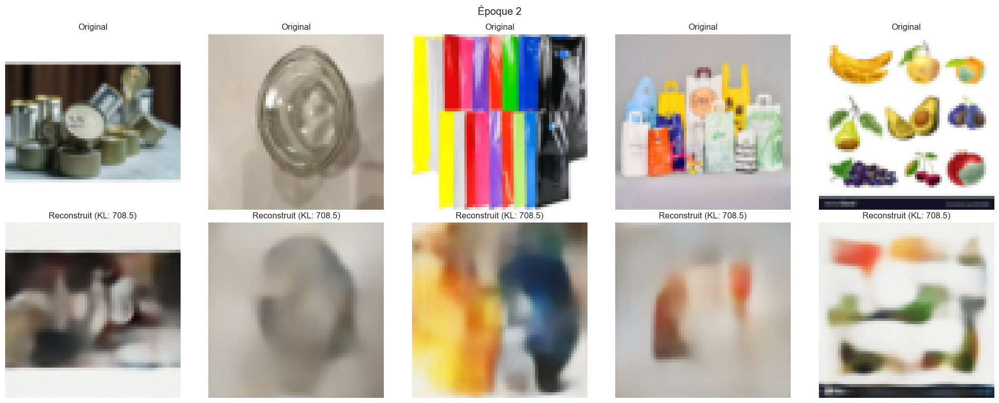

683/683 ━━━━━━━━━━━━━━━━━━━━ 470s 689ms/step - kl_loss: 708.5294 - loss: 6141.2495 - recon_loss: 6134.1582 - val_kl_loss: 712.1328 - val_loss: 6022.9829 - val_recon_loss: 6015.8608 - learning_rate: 0.0010
Epoch 3/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 661ms/step - kl_loss: 707.8838 - loss: 6142.9282 - recon_loss: 6135.8481
Epoch 3: val_recon_loss did not improve from 6008.73730


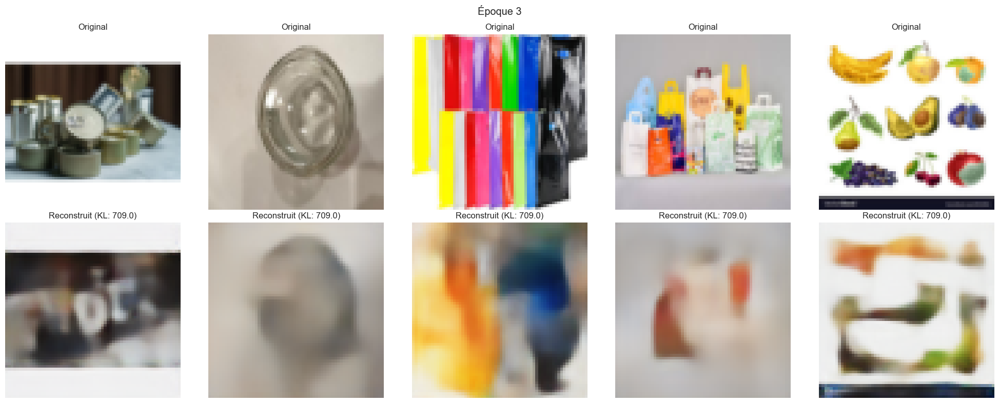

683/683 ━━━━━━━━━━━━━━━━━━━━ 469s 687ms/step - kl_loss: 708.9654 - loss: 6139.4004 - recon_loss: 6132.3066 - val_kl_loss: 735.5718 - val_loss: 6018.2466 - val_recon_loss: 6010.8906 - learning_rate: 0.0010
Epoch 4/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 670ms/step - kl_loss: 708.0260 - loss: 6155.1318 - recon_loss: 6148.0513
Epoch 4: val_recon_loss improved from 6008.73730 to 6008.52637, saving model to model_dct_9.keras


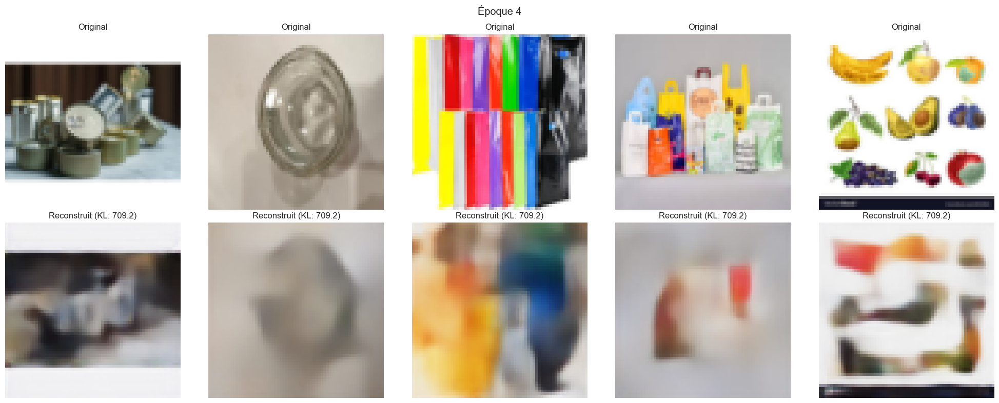

683/683 ━━━━━━━━━━━━━━━━━━━━ 476s 697ms/step - kl_loss: 709.1630 - loss: 6137.9707 - recon_loss: 6130.8765 - val_kl_loss: 710.5115 - val_loss: 6015.6304 - val_recon_loss: 6008.5264 - learning_rate: 0.0010
Epoch 5/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 662ms/step - kl_loss: 713.7095 - loss: 6137.4678 - recon_loss: 6130.3325
Epoch 5: val_recon_loss improved from 6008.52637 to 6002.27100, saving model to model_dct_9.keras


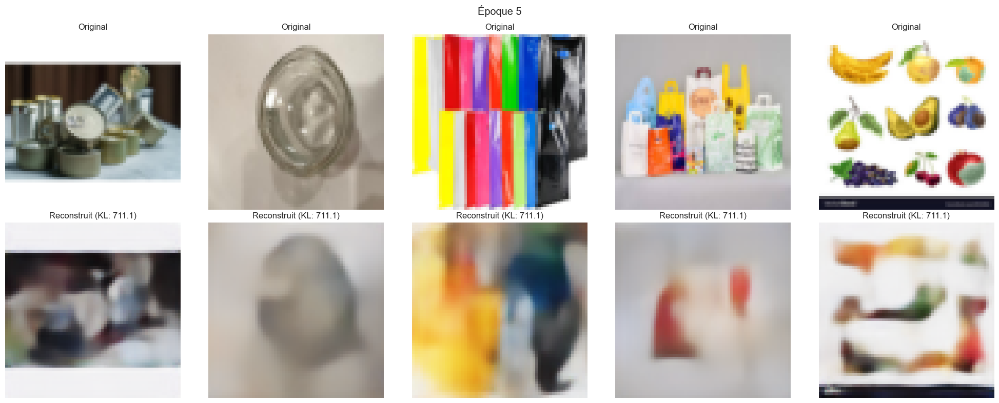

683/683 ━━━━━━━━━━━━━━━━━━━━ 470s 688ms/step - kl_loss: 711.0723 - loss: 6136.3325 - recon_loss: 6129.2236 - val_kl_loss: 739.0369 - val_loss: 6009.6616 - val_recon_loss: 6002.2710 - learning_rate: 0.0010
Epoch 6/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 663ms/step - kl_loss: 711.4803 - loss: 6149.6484 - recon_loss: 6142.5317
Epoch 6: val_recon_loss did not improve from 6002.27100


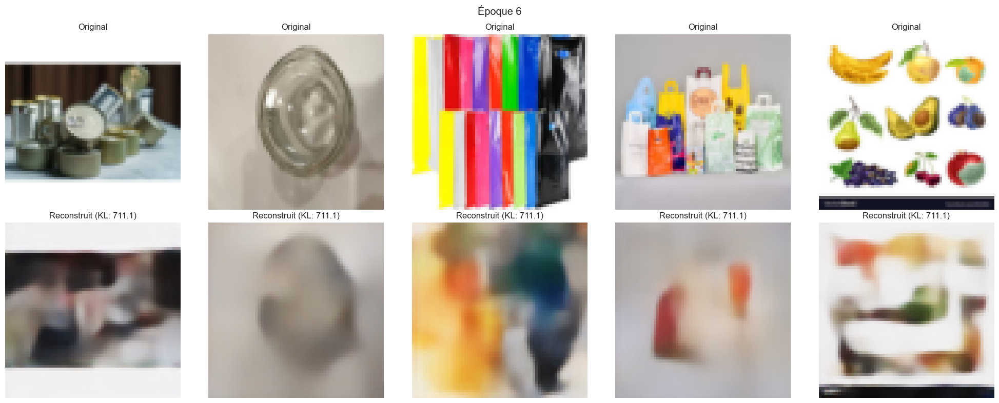

683/683 ━━━━━━━━━━━━━━━━━━━━ 470s 688ms/step - kl_loss: 711.0825 - loss: 6135.4761 - recon_loss: 6128.3652 - val_kl_loss: 703.6500 - val_loss: 6014.0049 - val_recon_loss: 6006.9678 - learning_rate: 0.0010
Epoch 7/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 656ms/step - kl_loss: 712.1512 - loss: 6114.5737 - recon_loss: 6107.4536
Epoch 7: val_recon_loss did not improve from 6002.27100


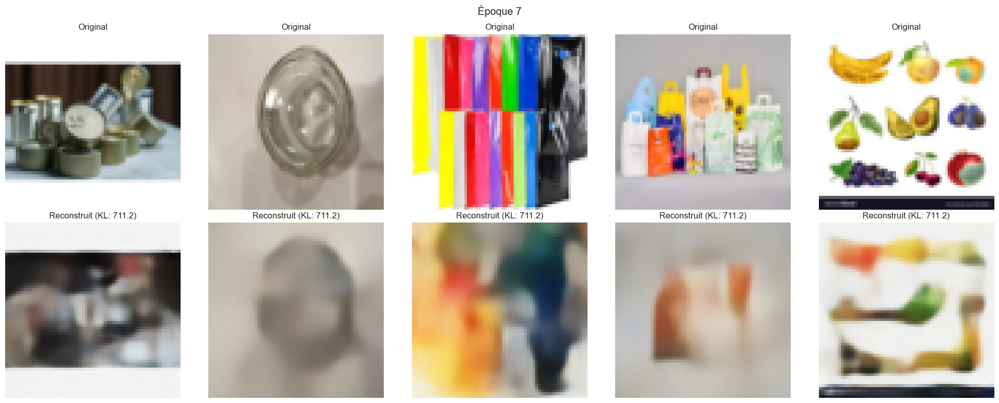

683/683 ━━━━━━━━━━━━━━━━━━━━ 465s 681ms/step - kl_loss: 711.1555 - loss: 6133.2544 - recon_loss: 6126.1416 - val_kl_loss: 721.9827 - val_loss: 6017.0176 - val_recon_loss: 6009.7969 - learning_rate: 0.0010
Epoch 8/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - kl_loss: 711.9567 - loss: 6150.5342 - recon_loss: 6143.4150
Epoch 8: val_recon_loss improved from 6002.27100 to 5989.71436, saving model to model_dct_9.keras


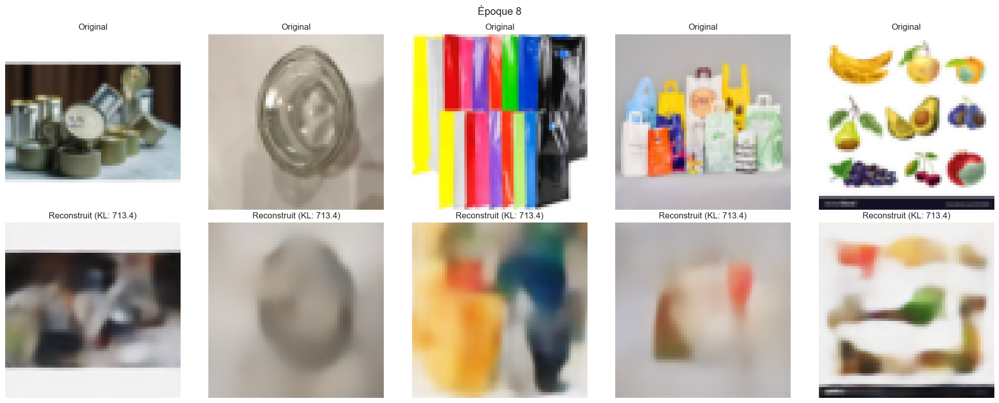

683/683 ━━━━━━━━━━━━━━━━━━━━ 460s 673ms/step - kl_loss: 713.4476 - loss: 6133.2578 - recon_loss: 6126.1226 - val_kl_loss: 700.1716 - val_loss: 5996.7153 - val_recon_loss: 5989.7144 - learning_rate: 0.0010
Epoch 9/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 655ms/step - kl_loss: 708.4976 - loss: 6135.2212 - recon_loss: 6128.1362
Epoch 9: val_recon_loss did not improve from 5989.71436


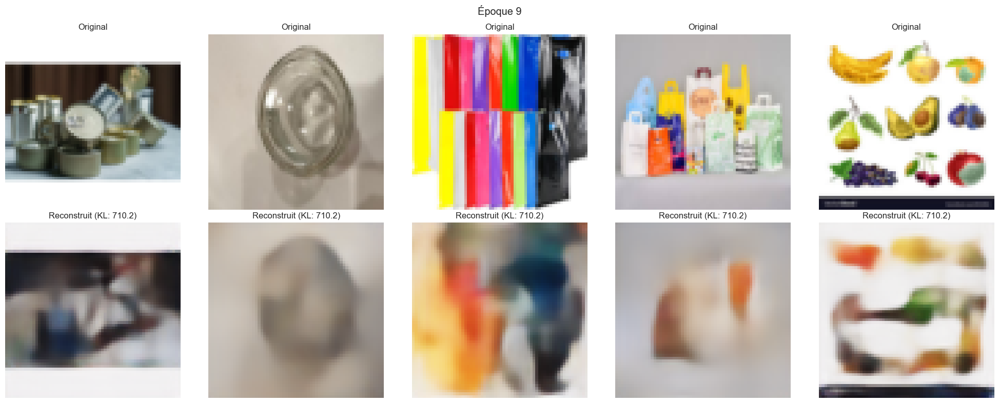

683/683 ━━━━━━━━━━━━━━━━━━━━ 465s 681ms/step - kl_loss: 710.1599 - loss: 6129.7637 - recon_loss: 6122.6631 - val_kl_loss: 711.3683 - val_loss: 6013.6680 - val_recon_loss: 6006.5532 - learning_rate: 0.0010
Epoch 10/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 665ms/step - kl_loss: 707.4298 - loss: 6132.9297 - recon_loss: 6125.8516
Epoch 10: val_recon_loss improved from 5989.71436 to 5980.07178, saving model to model_dct_9.keras


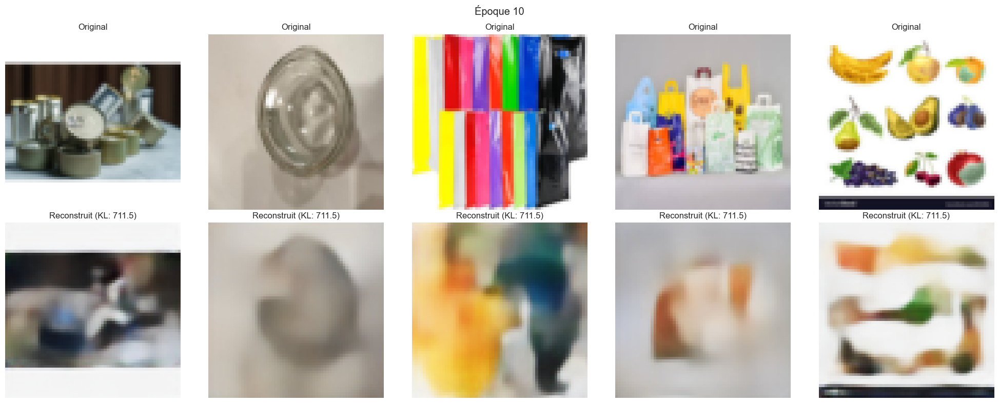

683/683 ━━━━━━━━━━━━━━━━━━━━ 473s 692ms/step - kl_loss: 711.5283 - loss: 6131.1304 - recon_loss: 6124.0137 - val_kl_loss: 725.8184 - val_loss: 5987.3296 - val_recon_loss: 5980.0718 - learning_rate: 0.0010
Epoch 11/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 661ms/step - kl_loss: 710.8168 - loss: 6124.7397 - recon_loss: 6117.6313
Epoch 11: val_recon_loss did not improve from 5980.07178


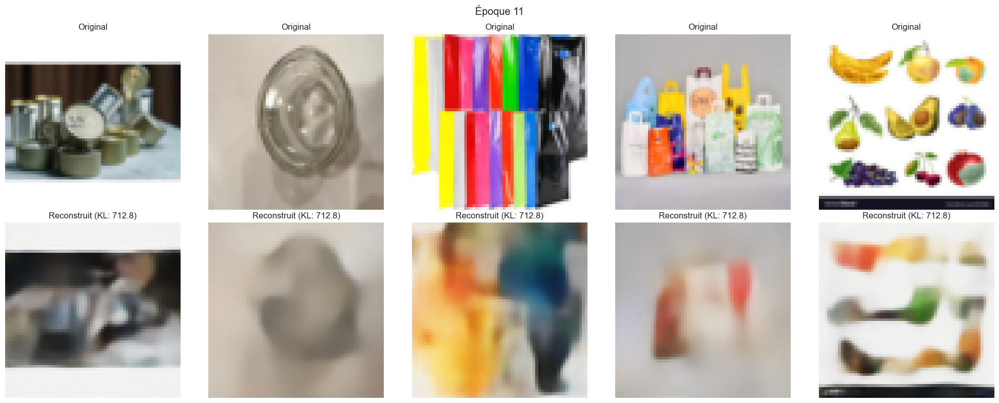

683/683 ━━━━━━━━━━━━━━━━━━━━ 469s 686ms/step - kl_loss: 712.8351 - loss: 6127.2534 - recon_loss: 6120.1274 - val_kl_loss: 703.3948 - val_loss: 5997.5376 - val_recon_loss: 5990.5044 - learning_rate: 0.0010
Epoch 12/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 656ms/step - kl_loss: 713.6325 - loss: 6129.2739 - recon_loss: 6122.1377
Epoch 12: val_recon_loss did not improve from 5980.07178


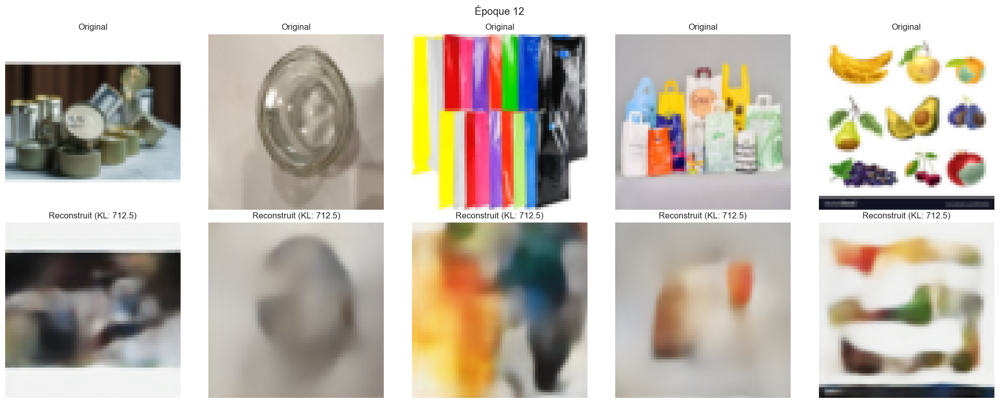

683/683 ━━━━━━━━━━━━━━━━━━━━ 503s 688ms/step - kl_loss: 712.4749 - loss: 6128.0898 - recon_loss: 6120.9639 - val_kl_loss: 739.9438 - val_loss: 6004.7852 - val_recon_loss: 5997.3848 - learning_rate: 0.0010
Epoch 13/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 670ms/step - kl_loss: 714.0394 - loss: 6101.4946 - recon_loss: 6094.3545
Epoch 13: val_recon_loss did not improve from 5980.07178


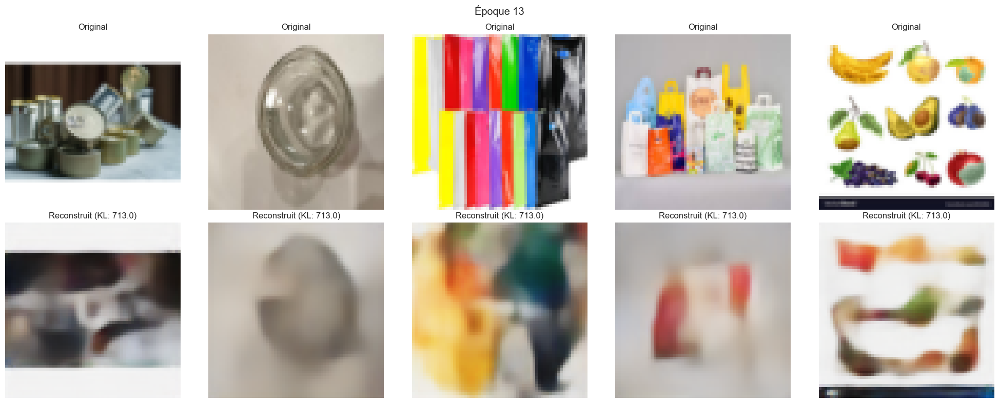

683/683 ━━━━━━━━━━━━━━━━━━━━ 475s 696ms/step - kl_loss: 712.9615 - loss: 6126.9365 - recon_loss: 6119.8047 - val_kl_loss: 738.5017 - val_loss: 5999.1729 - val_recon_loss: 5991.7856 - learning_rate: 0.0010
Epoch 14/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 669ms/step - kl_loss: 714.8460 - loss: 6121.3965 - recon_loss: 6114.2456
Epoch 14: val_recon_loss did not improve from 5980.07178


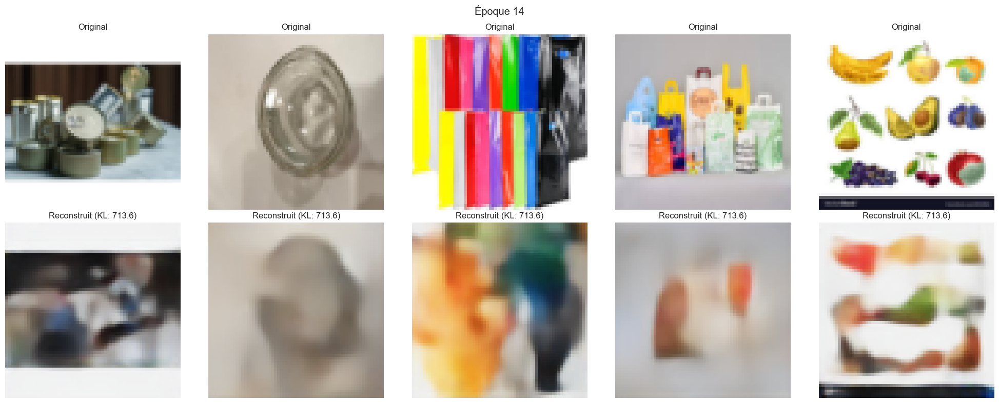

683/683 ━━━━━━━━━━━━━━━━━━━━ 475s 695ms/step - kl_loss: 713.5908 - loss: 6126.8604 - recon_loss: 6119.7212 - val_kl_loss: 721.4218 - val_loss: 6001.6069 - val_recon_loss: 5994.3916 - learning_rate: 0.0010
Epoch 15/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 665ms/step - kl_loss: 712.6845 - loss: 6112.7109 - recon_loss: 6105.5859
Epoch 15: val_recon_loss did not improve from 5980.07178


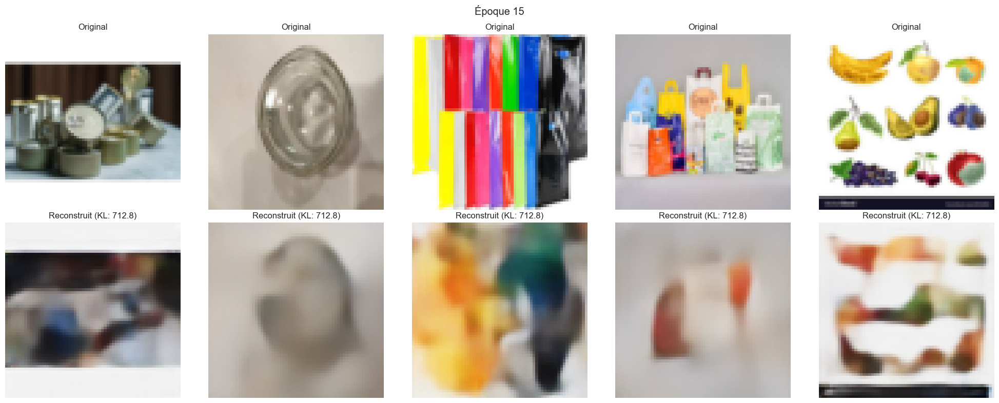

683/683 ━━━━━━━━━━━━━━━━━━━━ 472s 691ms/step - kl_loss: 712.7917 - loss: 6124.4702 - recon_loss: 6117.3447 - val_kl_loss: 729.9316 - val_loss: 6006.0366 - val_recon_loss: 5998.7363 - learning_rate: 0.0010
Epoch 16/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 664ms/step - kl_loss: 714.1183 - loss: 6123.6724 - recon_loss: 6116.5317
Epoch 16: val_recon_loss did not improve from 5980.07178


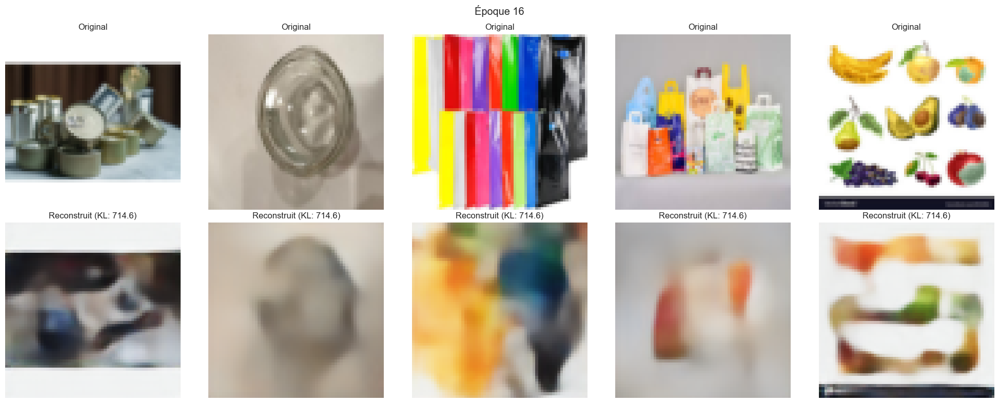

683/683 ━━━━━━━━━━━━━━━━━━━━ 471s 690ms/step - kl_loss: 714.6086 - loss: 6123.8579 - recon_loss: 6116.7129 - val_kl_loss: 725.3104 - val_loss: 6006.3130 - val_recon_loss: 5999.0586 - learning_rate: 0.0010
Epoch 17/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 671ms/step - kl_loss: 713.6451 - loss: 6126.5239 - recon_loss: 6119.3896
Epoch 17: val_recon_loss did not improve from 5980.07178


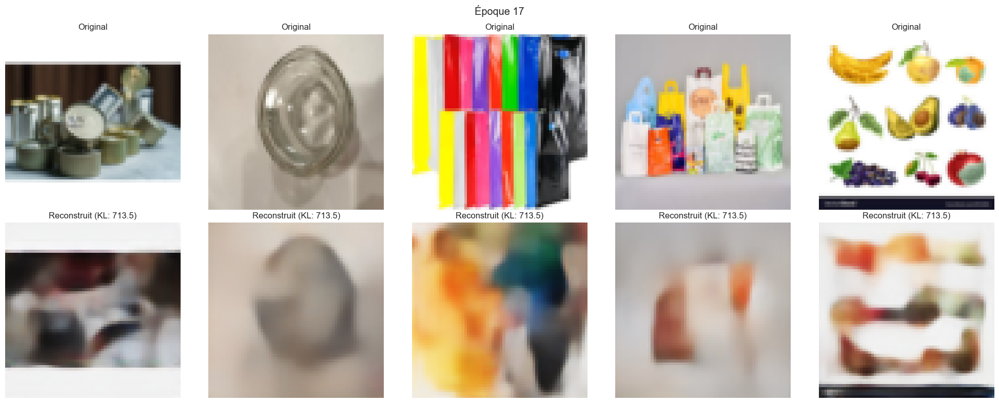

683/683 ━━━━━━━━━━━━━━━━━━━━ 476s 697ms/step - kl_loss: 713.4636 - loss: 6121.4443 - recon_loss: 6114.3125 - val_kl_loss: 735.3287 - val_loss: 6003.2510 - val_recon_loss: 5995.8960 - learning_rate: 0.0010
Epoch 18/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 670ms/step - kl_loss: 712.4263 - loss: 6122.7915 - recon_loss: 6115.6675
Epoch 18: val_recon_loss did not improve from 5980.07178


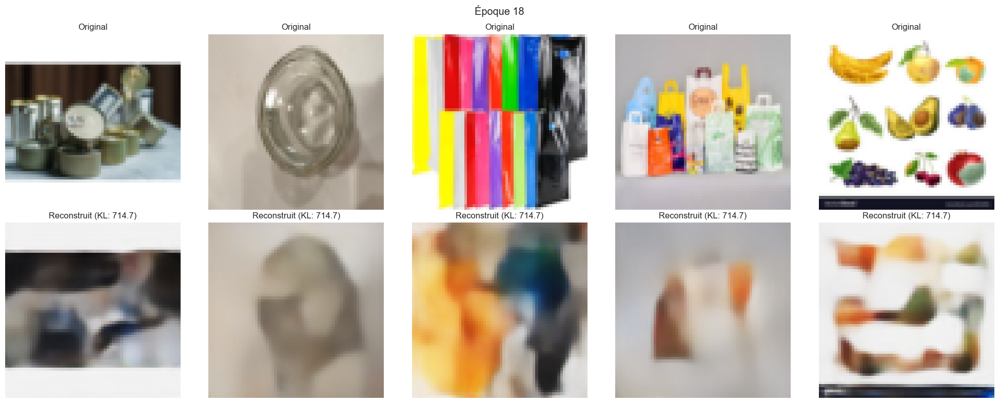

683/683 ━━━━━━━━━━━━━━━━━━━━ 475s 696ms/step - kl_loss: 714.6843 - loss: 6120.9556 - recon_loss: 6113.8091 - val_kl_loss: 715.5045 - val_loss: 6008.6157 - val_recon_loss: 6001.4595 - learning_rate: 0.0010
Epoch 19/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 669ms/step - kl_loss: 714.9665 - loss: 6102.7764 - recon_loss: 6095.6279
Epoch 19: val_recon_loss did not improve from 5980.07178


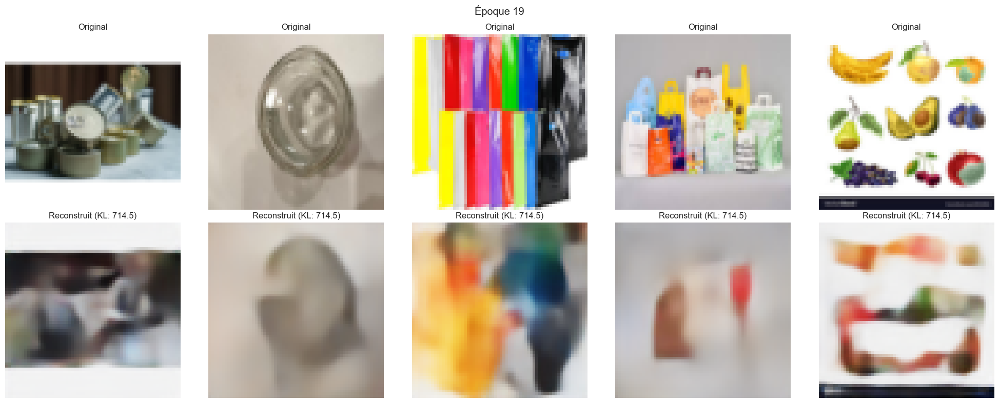

683/683 ━━━━━━━━━━━━━━━━━━━━ 475s 695ms/step - kl_loss: 714.5135 - loss: 6120.1353 - recon_loss: 6112.9897 - val_kl_loss: 717.8976 - val_loss: 6000.9478 - val_recon_loss: 5993.7676 - learning_rate: 0.0010
Epoch 20/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 669ms/step - kl_loss: 716.4047 - loss: 6129.6465 - recon_loss: 6122.4795
Epoch 20: val_recon_loss did not improve from 5980.07178

Epoch 20: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.


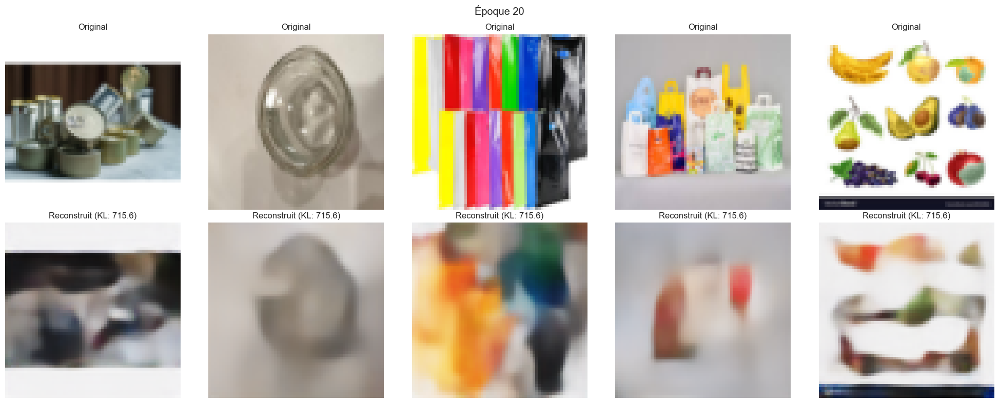

683/683 ━━━━━━━━━━━━━━━━━━━━ 475s 695ms/step - kl_loss: 715.6479 - loss: 6120.1392 - recon_loss: 6112.9775 - val_kl_loss: 707.9111 - val_loss: 6008.7773 - val_recon_loss: 6001.6997 - learning_rate: 0.0010
Epoch 21/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 648ms/step - kl_loss: 713.9161 - loss: 6088.6470 - recon_loss: 6081.5103
Epoch 21: val_recon_loss improved from 5980.07178 to 5979.46777, saving model to model_dct_9.keras


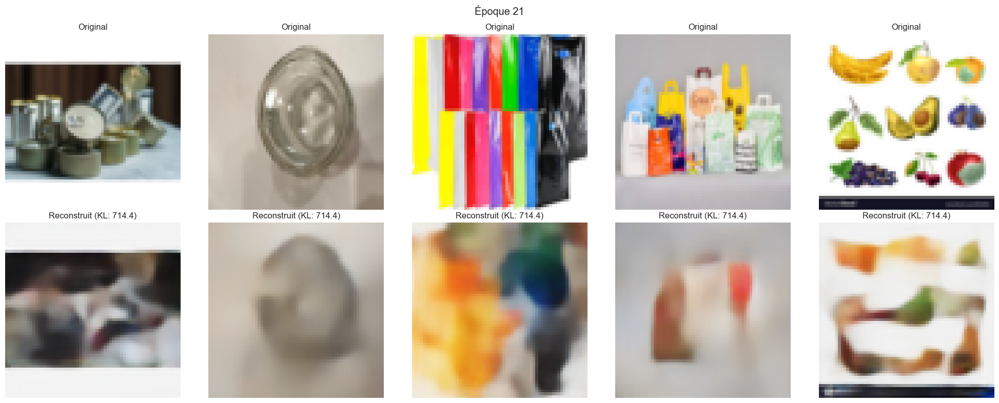

683/683 ━━━━━━━━━━━━━━━━━━━━ 489s 675ms/step - kl_loss: 714.3857 - loss: 6102.5063 - recon_loss: 6095.3667 - val_kl_loss: 719.2853 - val_loss: 5986.6597 - val_recon_loss: 5979.4678 - learning_rate: 5.0000e-04
Epoch 22/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 665ms/step - kl_loss: 718.6334 - loss: 6101.9272 - recon_loss: 6094.7397
Epoch 22: val_recon_loss improved from 5979.46777 to 5977.04346, saving model to model_dct_9.keras


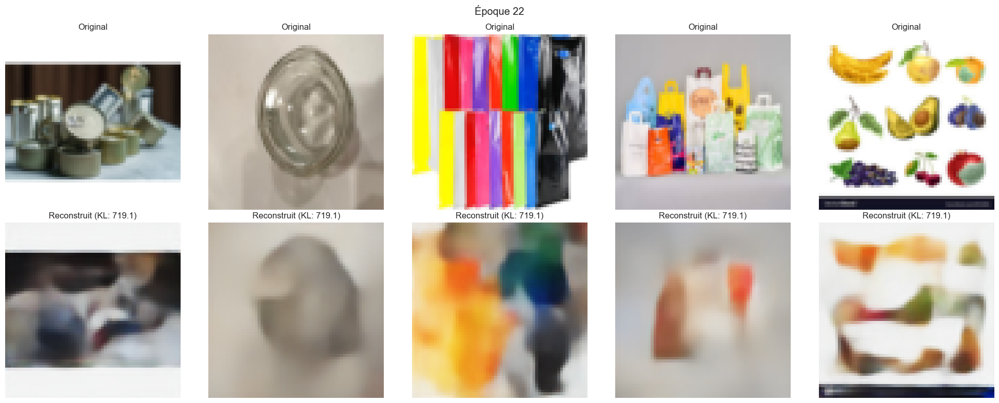

683/683 ━━━━━━━━━━━━━━━━━━━━ 473s 693ms/step - kl_loss: 719.0750 - loss: 6093.9321 - recon_loss: 6086.7368 - val_kl_loss: 720.9455 - val_loss: 5984.2539 - val_recon_loss: 5977.0435 - learning_rate: 5.0000e-04
Epoch 23/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 665ms/step - kl_loss: 721.0412 - loss: 6081.4082 - recon_loss: 6074.1958
Epoch 23: val_recon_loss did not improve from 5977.04346


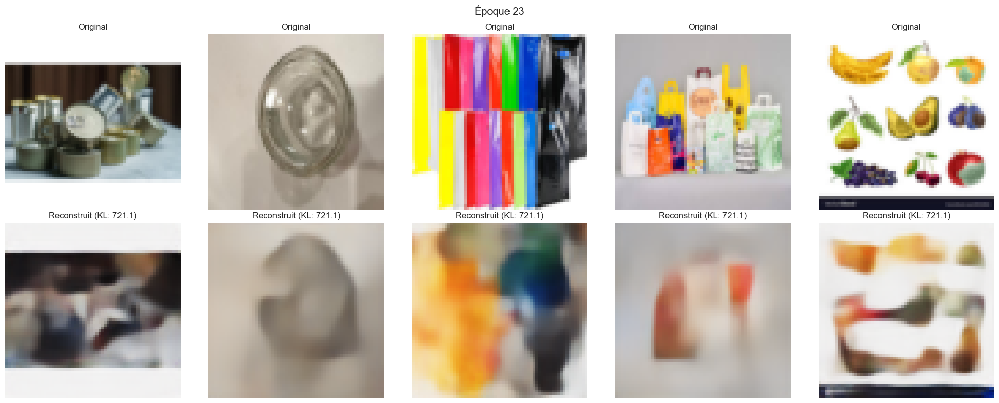

683/683 ━━━━━━━━━━━━━━━━━━━━ 472s 690ms/step - kl_loss: 721.0869 - loss: 6092.2378 - recon_loss: 6085.0215 - val_kl_loss: 723.1940 - val_loss: 6003.3735 - val_recon_loss: 5996.1411 - learning_rate: 5.0000e-04
Epoch 24/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 668ms/step - kl_loss: 724.5342 - loss: 6078.7852 - recon_loss: 6071.5400
Epoch 24: val_recon_loss did not improve from 5977.04346


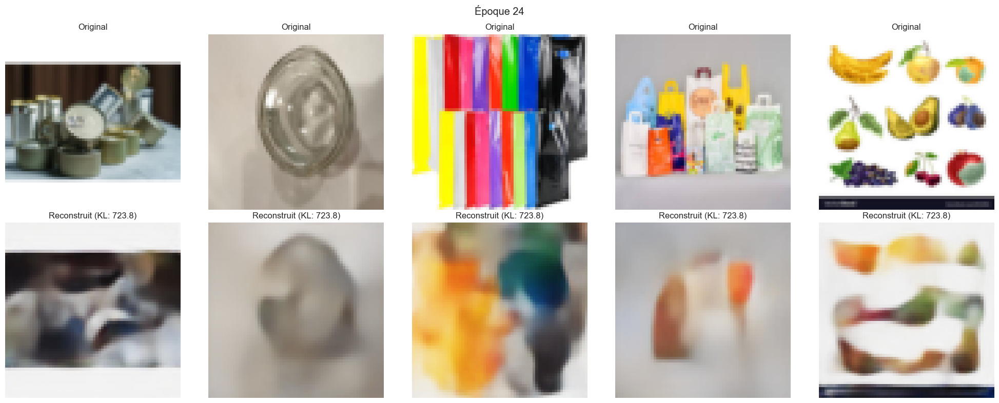

683/683 ━━━━━━━━━━━━━━━━━━━━ 474s 694ms/step - kl_loss: 723.8256 - loss: 6090.8916 - recon_loss: 6083.6538 - val_kl_loss: 720.8559 - val_loss: 5988.0039 - val_recon_loss: 5980.7954 - learning_rate: 5.0000e-04
Epoch 25/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 669ms/step - kl_loss: 727.7171 - loss: 6091.1504 - recon_loss: 6083.8730
Epoch 25: val_recon_loss did not improve from 5977.04346


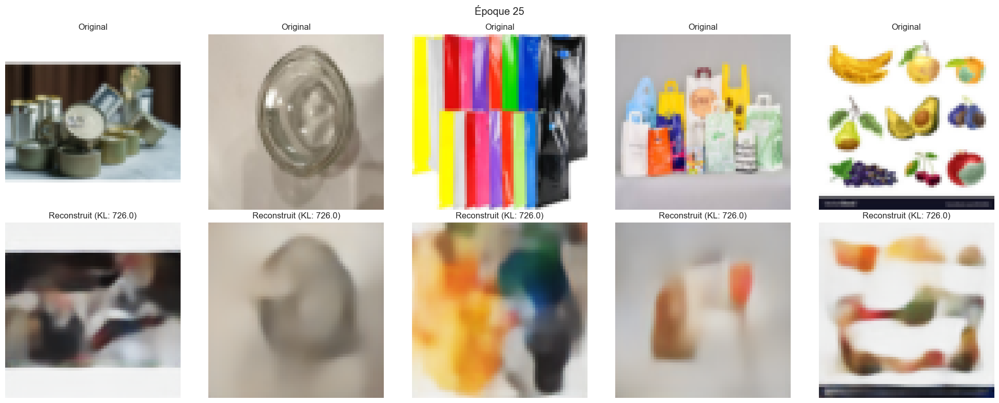

683/683 ━━━━━━━━━━━━━━━━━━━━ 475s 695ms/step - kl_loss: 726.0297 - loss: 6089.0430 - recon_loss: 6081.7808 - val_kl_loss: 726.8594 - val_loss: 5989.5776 - val_recon_loss: 5982.3086 - learning_rate: 5.0000e-04
Epoch 26/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 661ms/step - kl_loss: 726.4581 - loss: 6065.3022 - recon_loss: 6058.0361
Epoch 26: val_recon_loss did not improve from 5977.04346


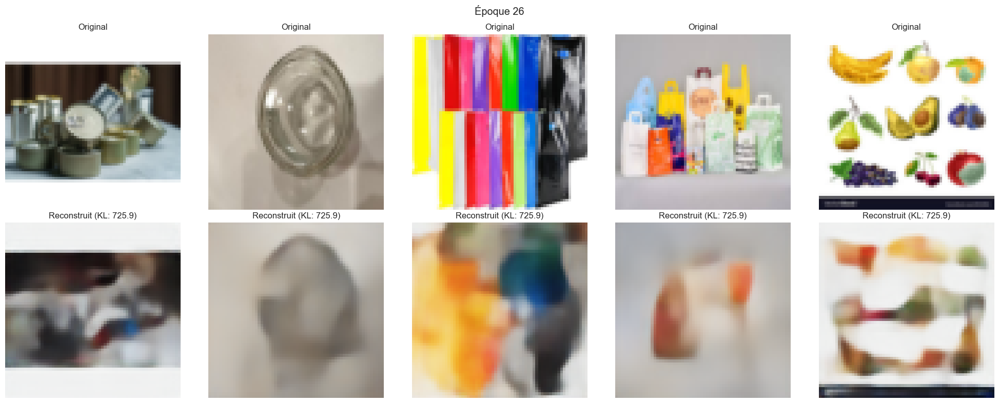

683/683 ━━━━━━━━━━━━━━━━━━━━ 468s 686ms/step - kl_loss: 725.8942 - loss: 6088.8789 - recon_loss: 6081.6147 - val_kl_loss: 719.7365 - val_loss: 6000.4683 - val_recon_loss: 5993.2710 - learning_rate: 5.0000e-04
Epoch 27/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 658ms/step - kl_loss: 727.6630 - loss: 6076.8008 - recon_loss: 6069.5249
Epoch 27: val_recon_loss did not improve from 5977.04346


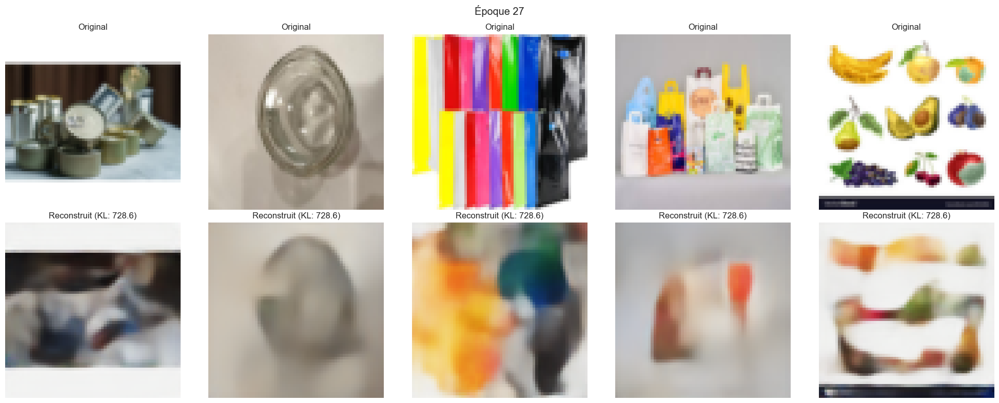

683/683 ━━━━━━━━━━━━━━━━━━━━ 467s 684ms/step - kl_loss: 728.5795 - loss: 6087.4678 - recon_loss: 6080.1836 - val_kl_loss: 732.8109 - val_loss: 5990.1753 - val_recon_loss: 5982.8467 - learning_rate: 5.0000e-04
Epoch 28/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 672ms/step - kl_loss: 730.5115 - loss: 6084.3696 - recon_loss: 6077.0654
Epoch 28: val_recon_loss did not improve from 5977.04346


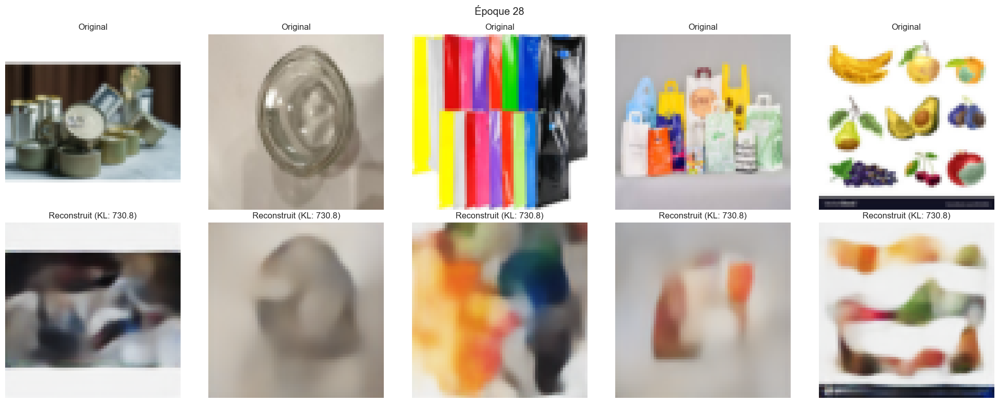

683/683 ━━━━━━━━━━━━━━━━━━━━ 476s 698ms/step - kl_loss: 730.8143 - loss: 6086.7666 - recon_loss: 6079.4609 - val_kl_loss: 729.1848 - val_loss: 5997.8984 - val_recon_loss: 5990.6069 - learning_rate: 5.0000e-04
Epoch 29/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 661ms/step - kl_loss: 729.8688 - loss: 6087.1592 - recon_loss: 6079.8599
Epoch 29: val_recon_loss did not improve from 5977.04346


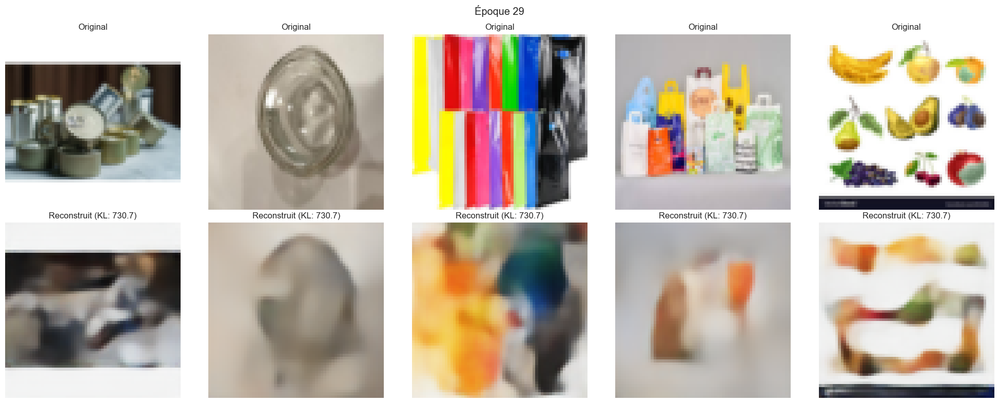

683/683 ━━━━━━━━━━━━━━━━━━━━ 469s 687ms/step - kl_loss: 730.7019 - loss: 6085.9810 - recon_loss: 6078.6724 - val_kl_loss: 744.3381 - val_loss: 5989.9775 - val_recon_loss: 5982.5327 - learning_rate: 5.0000e-04
Epoch 30/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 672ms/step - kl_loss: 732.8334 - loss: 6062.0166 - recon_loss: 6054.6895
Epoch 30: val_recon_loss did not improve from 5977.04346


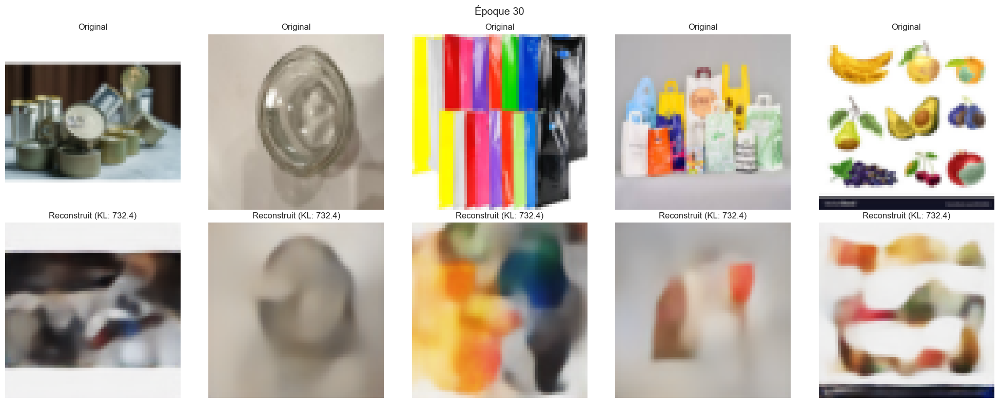

683/683 ━━━━━━━━━━━━━━━━━━━━ 477s 698ms/step - kl_loss: 732.3646 - loss: 6084.9399 - recon_loss: 6077.6191 - val_kl_loss: 731.5371 - val_loss: 6001.0928 - val_recon_loss: 5993.7783 - learning_rate: 5.0000e-04
Epoch 31/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 673ms/step - kl_loss: 732.4298 - loss: 6104.2866 - recon_loss: 6096.9629
Epoch 31: val_recon_loss did not improve from 5977.04346


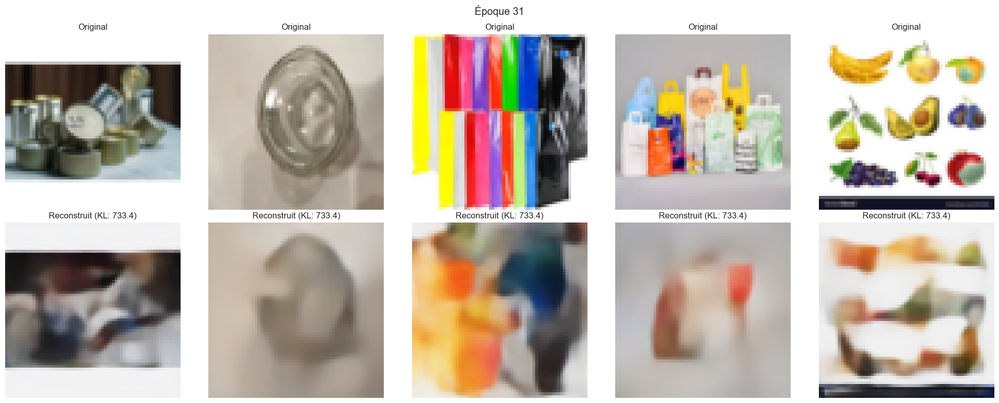

683/683 ━━━━━━━━━━━━━━━━━━━━ 477s 698ms/step - kl_loss: 733.3842 - loss: 6084.8291 - recon_loss: 6077.4946 - val_kl_loss: 727.9810 - val_loss: 5994.5552 - val_recon_loss: 5987.2769 - learning_rate: 5.0000e-04
Epoch 32/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 676ms/step - kl_loss: 733.1760 - loss: 6072.2261 - recon_loss: 6064.8931
Epoch 32: val_recon_loss did not improve from 5977.04346

Epoch 32: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.


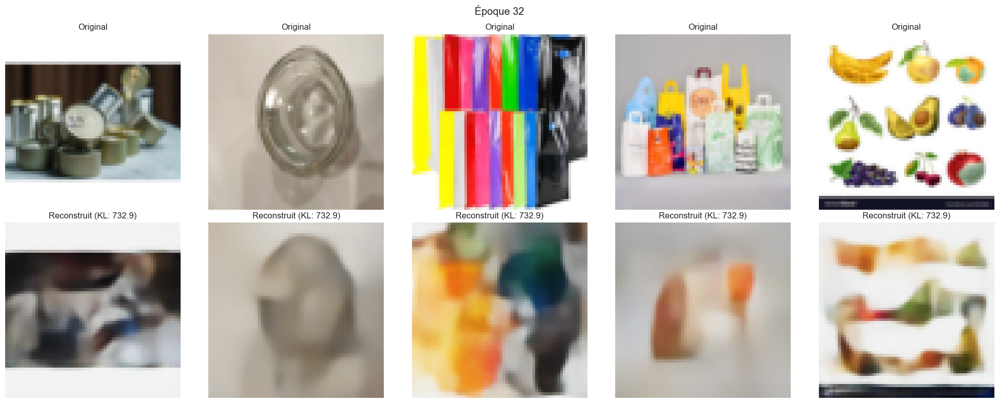

683/683 ━━━━━━━━━━━━━━━━━━━━ 479s 702ms/step - kl_loss: 732.9414 - loss: 6083.5015 - recon_loss: 6076.1704 - val_kl_loss: 732.9328 - val_loss: 5998.0132 - val_recon_loss: 5990.6836 - learning_rate: 5.0000e-04
Epoch 33/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 660ms/step - kl_loss: 735.1035 - loss: 6077.2246 - recon_loss: 6069.8735
Epoch 33: val_recon_loss did not improve from 5977.04346


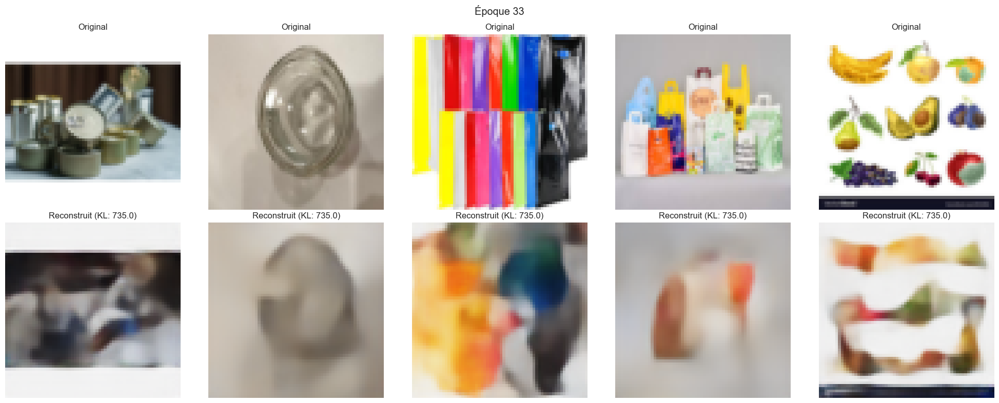

683/683 ━━━━━━━━━━━━━━━━━━━━ 468s 686ms/step - kl_loss: 734.9681 - loss: 6076.4634 - recon_loss: 6069.1162 - val_kl_loss: 748.0585 - val_loss: 5992.5815 - val_recon_loss: 5985.1021 - learning_rate: 2.5000e-04
Epoch 34/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 659ms/step - kl_loss: 738.1450 - loss: 6082.4712 - recon_loss: 6075.0889
Epoch 34: val_recon_loss did not improve from 5977.04346


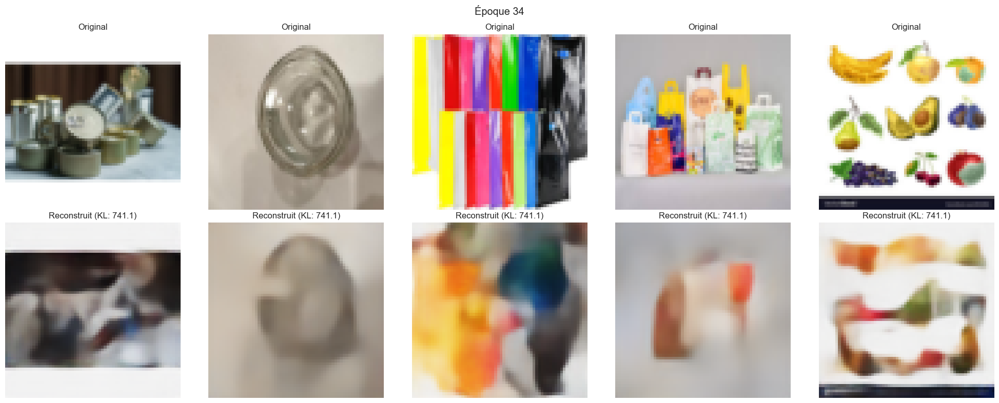

683/683 ━━━━━━━━━━━━━━━━━━━━ 467s 684ms/step - kl_loss: 741.0515 - loss: 6071.1880 - recon_loss: 6063.7754 - val_kl_loss: 741.2294 - val_loss: 5997.2881 - val_recon_loss: 5989.8765 - learning_rate: 2.5000e-04
Epoch 35/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - kl_loss: 744.2556 - loss: 6085.3989 - recon_loss: 6077.9570
Epoch 35: val_recon_loss did not improve from 5977.04346


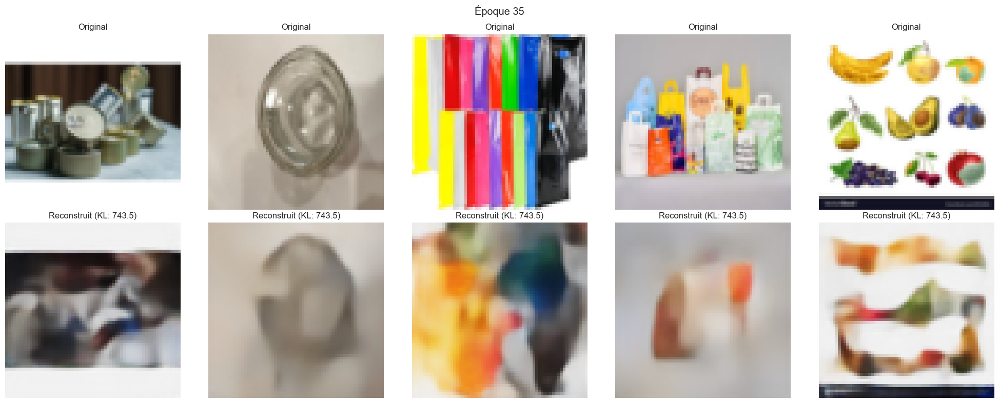

683/683 ━━━━━━━━━━━━━━━━━━━━ 1680s 2s/step - kl_loss: 743.4987 - loss: 6072.2397 - recon_loss: 6064.8062 - val_kl_loss: 748.7867 - val_loss: 5998.4375 - val_recon_loss: 5990.9507 - learning_rate: 2.5000e-04
Epoch 36/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 815ms/step - kl_loss: 746.2950 - loss: 6054.5083 - recon_loss: 6047.0439
Epoch 36: val_recon_loss did not improve from 5977.04346


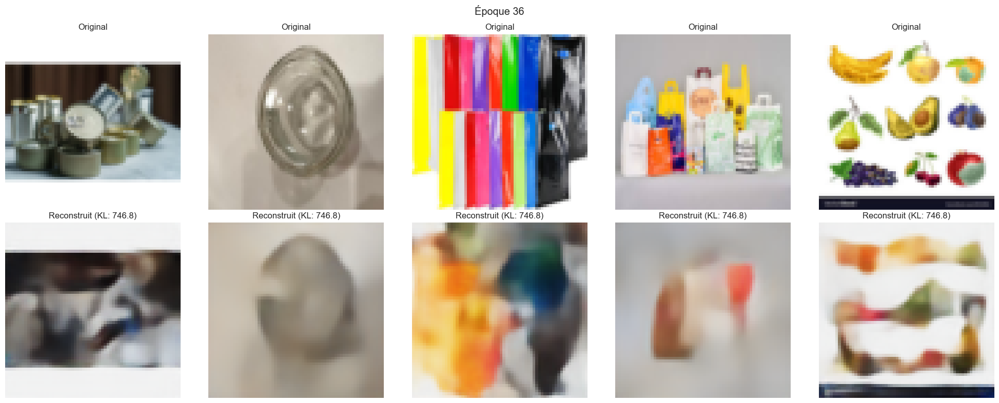

683/683 ━━━━━━━━━━━━━━━━━━━━ 639s 850ms/step - kl_loss: 746.7784 - loss: 6070.1333 - recon_loss: 6062.6650 - val_kl_loss: 747.5811 - val_loss: 6001.8384 - val_recon_loss: 5994.3633 - learning_rate: 2.5000e-04
Epoch 37/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 785ms/step - kl_loss: 746.8403 - loss: 6087.0352 - recon_loss: 6079.5659
Epoch 37: val_recon_loss did not improve from 5977.04346


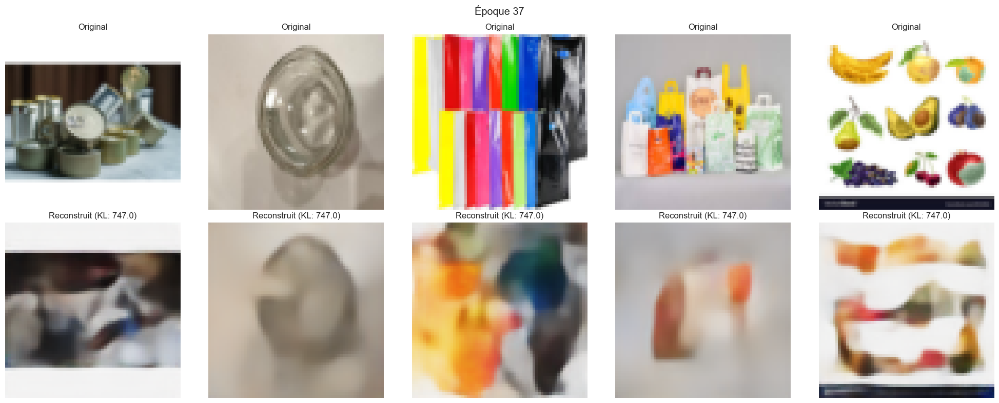

683/683 ━━━━━━━━━━━━━━━━━━━━ 556s 814ms/step - kl_loss: 747.0172 - loss: 6070.8721 - recon_loss: 6063.3999 - val_kl_loss: 751.3705 - val_loss: 5994.3813 - val_recon_loss: 5986.8687 - learning_rate: 2.5000e-04
Epoch 38/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 706ms/step - kl_loss: 749.8403 - loss: 6070.1152 - recon_loss: 6062.6147
Epoch 38: val_recon_loss did not improve from 5977.04346


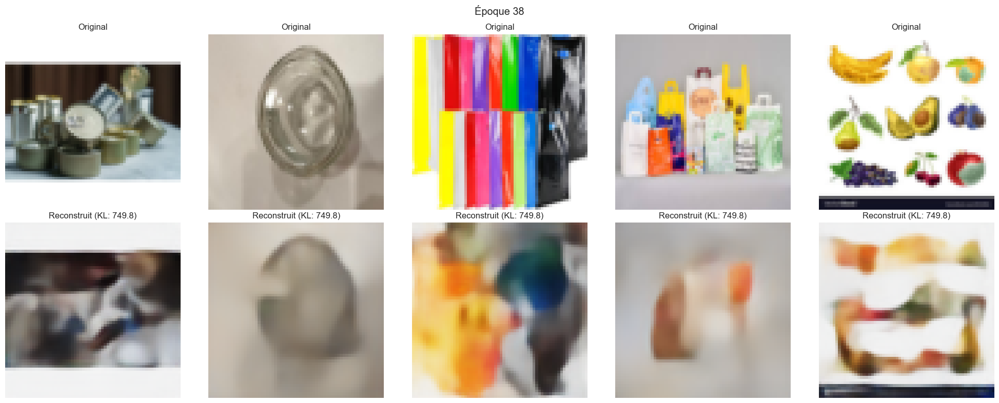

683/683 ━━━━━━━━━━━━━━━━━━━━ 501s 734ms/step - kl_loss: 749.8303 - loss: 6070.1279 - recon_loss: 6062.6265 - val_kl_loss: 750.8331 - val_loss: 6001.0991 - val_recon_loss: 5993.5913 - learning_rate: 2.5000e-04
Epoch 39/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 682ms/step - kl_loss: 749.5593 - loss: 6064.5166 - recon_loss: 6057.0205
Epoch 39: val_recon_loss did not improve from 5977.04346


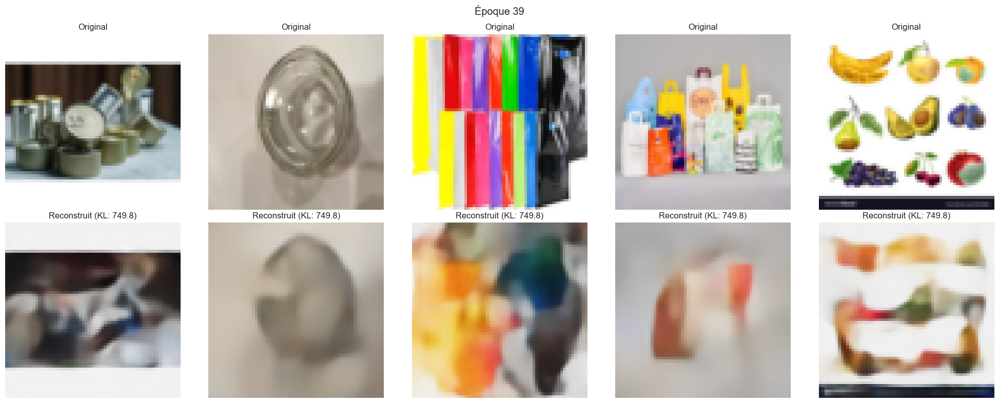

683/683 ━━━━━━━━━━━━━━━━━━━━ 484s 708ms/step - kl_loss: 749.7794 - loss: 6068.5894 - recon_loss: 6061.0903 - val_kl_loss: 751.1230 - val_loss: 6000.1626 - val_recon_loss: 5992.6519 - learning_rate: 2.5000e-04
Epoch 40/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 676ms/step - kl_loss: 749.3068 - loss: 6066.8501 - recon_loss: 6059.3550
Epoch 40: val_recon_loss did not improve from 5977.04346


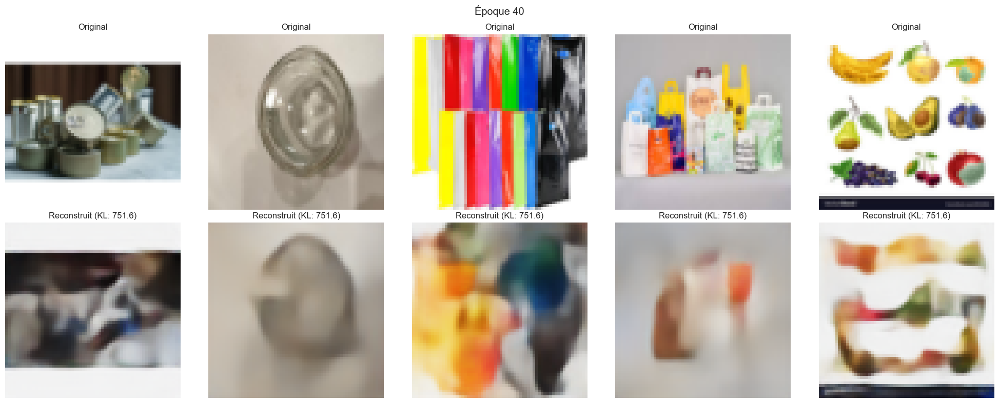

683/683 ━━━━━━━━━━━━━━━━━━━━ 481s 703ms/step - kl_loss: 751.6146 - loss: 6067.9102 - recon_loss: 6060.3901 - val_kl_loss: 756.9240 - val_loss: 6002.1445 - val_recon_loss: 5994.5752 - learning_rate: 2.5000e-04
Epoch 41/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 681ms/step - kl_loss: 753.7441 - loss: 6079.8438 - recon_loss: 6072.3076
Epoch 41: val_recon_loss did not improve from 5977.04346


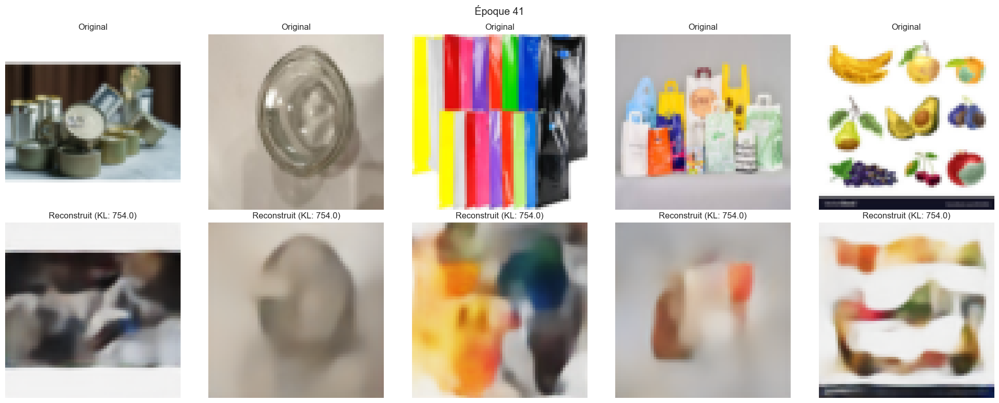

683/683 ━━━━━━━━━━━━━━━━━━━━ 485s 710ms/step - kl_loss: 754.0303 - loss: 6067.2593 - recon_loss: 6059.7192 - val_kl_loss: 758.8996 - val_loss: 6001.8672 - val_recon_loss: 5994.2793 - learning_rate: 2.5000e-04
Epoch 42/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 706ms/step - kl_loss: 754.3229 - loss: 6093.2192 - recon_loss: 6085.6758
Epoch 42: val_recon_loss did not improve from 5977.04346

Epoch 42: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.


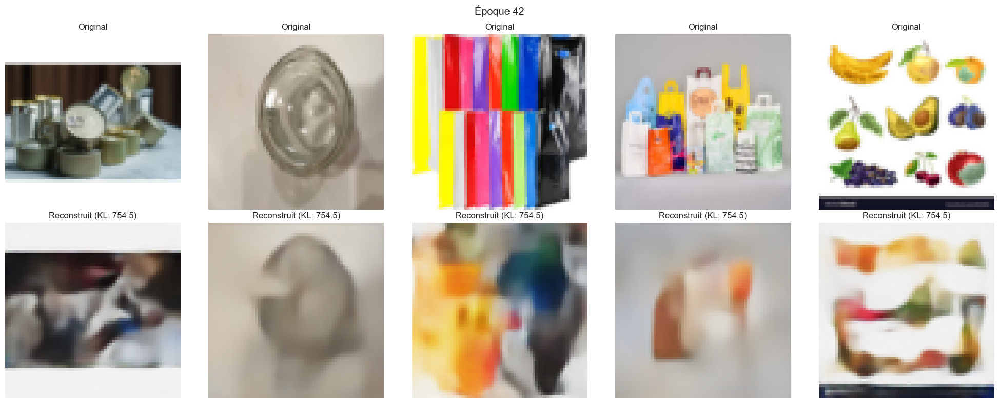

683/683 ━━━━━━━━━━━━━━━━━━━━ 500s 733ms/step - kl_loss: 754.5121 - loss: 6066.9121 - recon_loss: 6059.3662 - val_kl_loss: 754.3126 - val_loss: 5999.3350 - val_recon_loss: 5991.7915 - learning_rate: 2.5000e-04
Epoch 43/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 683ms/step - kl_loss: 755.0881 - loss: 6086.1182 - recon_loss: 6078.5679
Epoch 43: val_recon_loss did not improve from 5977.04346


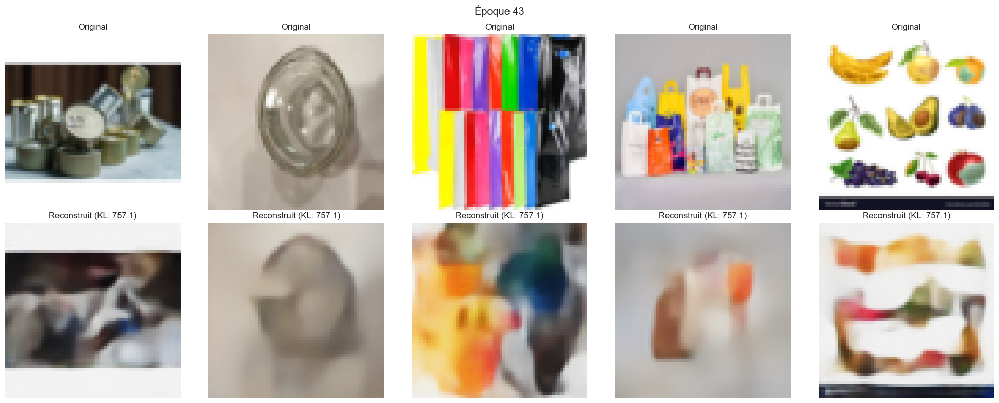

683/683 ━━━━━━━━━━━━━━━━━━━━ 490s 717ms/step - kl_loss: 757.0668 - loss: 6064.2930 - recon_loss: 6056.7207 - val_kl_loss: 765.7251 - val_loss: 6002.5972 - val_recon_loss: 5994.9390 - learning_rate: 1.2500e-04
Epoch 44/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 705ms/step - kl_loss: 760.0840 - loss: 6043.1748 - recon_loss: 6035.5757
Epoch 44: val_recon_loss did not improve from 5977.04346


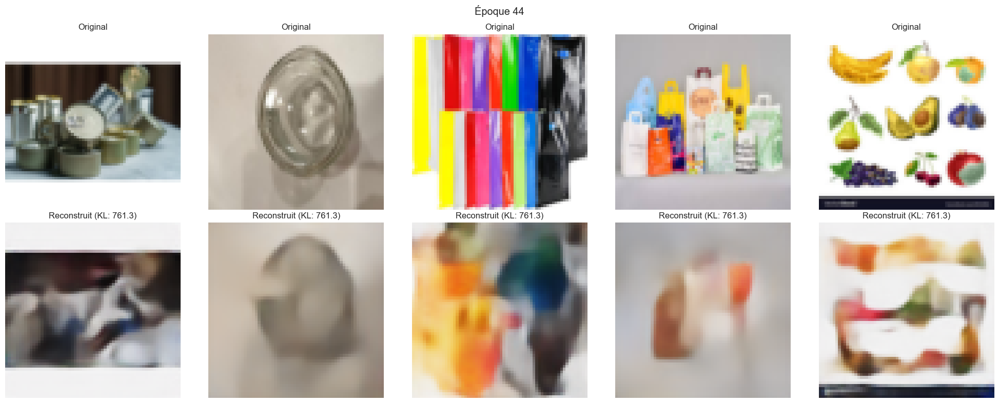

683/683 ━━━━━━━━━━━━━━━━━━━━ 507s 743ms/step - kl_loss: 761.2795 - loss: 6062.5029 - recon_loss: 6054.8921 - val_kl_loss: 760.9356 - val_loss: 5999.4380 - val_recon_loss: 5991.8301 - learning_rate: 1.2500e-04
Epoch 45/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 741ms/step - kl_loss: 761.1205 - loss: 6072.7632 - recon_loss: 6065.1519
Epoch 45: val_recon_loss did not improve from 5977.04346


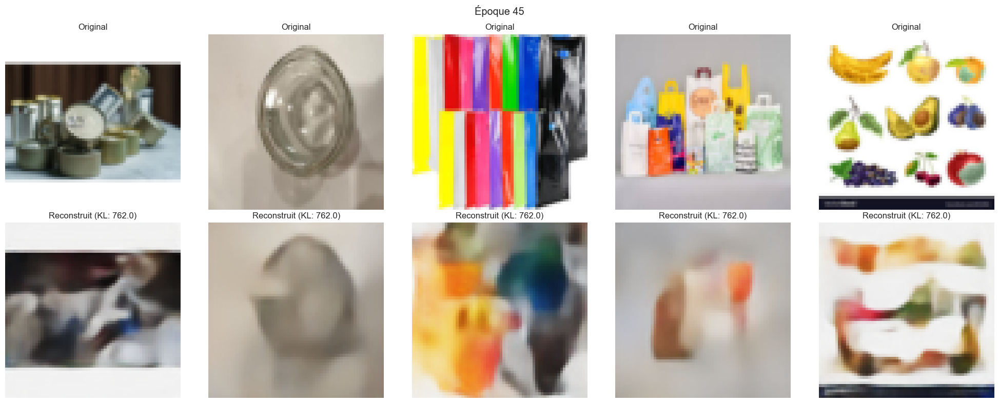

683/683 ━━━━━━━━━━━━━━━━━━━━ 533s 780ms/step - kl_loss: 761.9588 - loss: 6061.7622 - recon_loss: 6054.1436 - val_kl_loss: 763.6680 - val_loss: 6001.9707 - val_recon_loss: 5994.3345 - learning_rate: 1.2500e-04
Epoch 46/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - kl_loss: 765.3690 - loss: 6068.4429 - recon_loss: 6060.7910
Epoch 46: val_recon_loss did not improve from 5977.04346


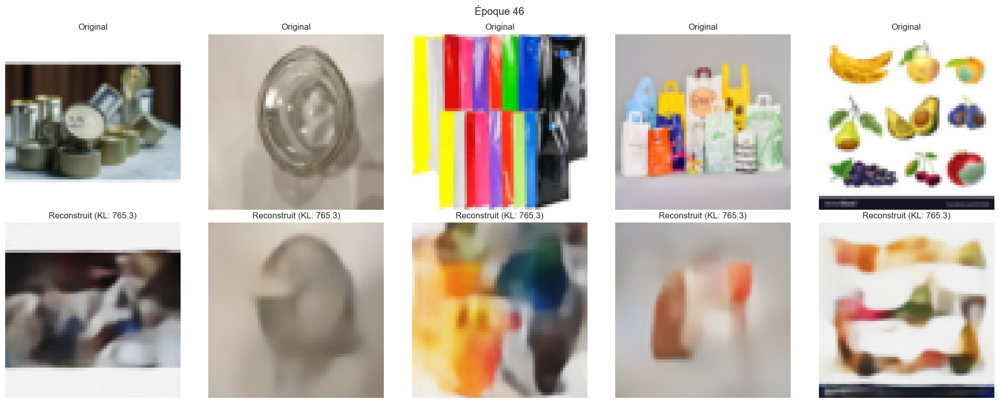

683/683 ━━━━━━━━━━━━━━━━━━━━ 733s 1s/step - kl_loss: 765.3101 - loss: 6061.8857 - recon_loss: 6054.2368 - val_kl_loss: 767.1052 - val_loss: 6003.0107 - val_recon_loss: 5995.3379 - learning_rate: 1.2500e-04
Epoch 47/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 702ms/step - kl_loss: 766.5035 - loss: 6081.4858 - recon_loss: 6073.8218
Epoch 47: val_recon_loss did not improve from 5977.04346


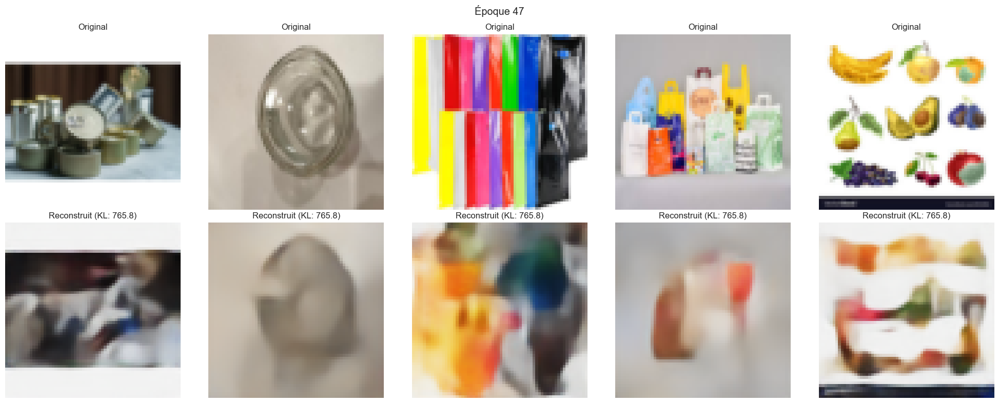

683/683 ━━━━━━━━━━━━━━━━━━━━ 498s 729ms/step - kl_loss: 765.8138 - loss: 6060.8701 - recon_loss: 6053.2124 - val_kl_loss: 769.5006 - val_loss: 6003.9395 - val_recon_loss: 5996.2441 - learning_rate: 1.2500e-04
Epoch 48/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 692ms/step - kl_loss: 766.4557 - loss: 6077.3979 - recon_loss: 6069.7329
Epoch 48: val_recon_loss did not improve from 5977.04346


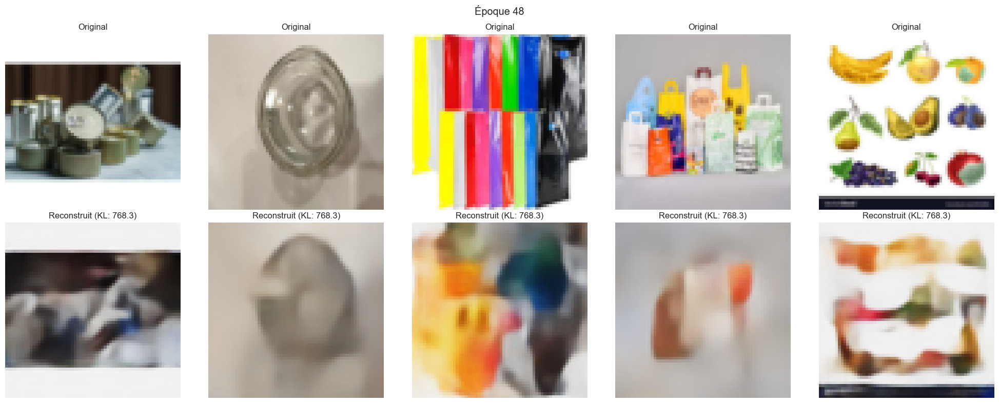

683/683 ━━━━━━━━━━━━━━━━━━━━ 492s 720ms/step - kl_loss: 768.2640 - loss: 6061.1050 - recon_loss: 6053.4238 - val_kl_loss: 762.8350 - val_loss: 6006.3193 - val_recon_loss: 5998.6919 - learning_rate: 1.2500e-04
Epoch 49/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 713ms/step - kl_loss: 767.3220 - loss: 6071.0625 - recon_loss: 6063.3901
Epoch 49: val_recon_loss did not improve from 5977.04346


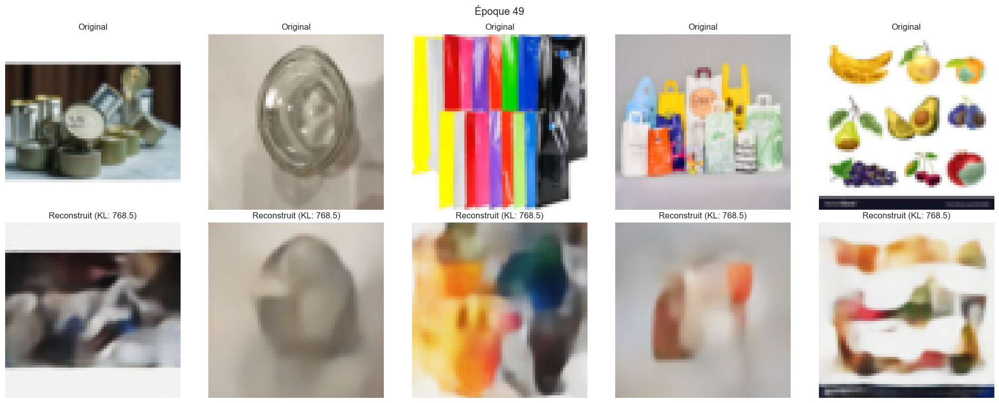

683/683 ━━━━━━━━━━━━━━━━━━━━ 511s 748ms/step - kl_loss: 768.5147 - loss: 6060.6919 - recon_loss: 6053.0083 - val_kl_loss: 769.1139 - val_loss: 6003.1416 - val_recon_loss: 5995.4502 - learning_rate: 1.2500e-04
Epoch 50/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 770ms/step - kl_loss: 767.3547 - loss: 6082.8062 - recon_loss: 6075.1323
Epoch 50: val_recon_loss did not improve from 5977.04346


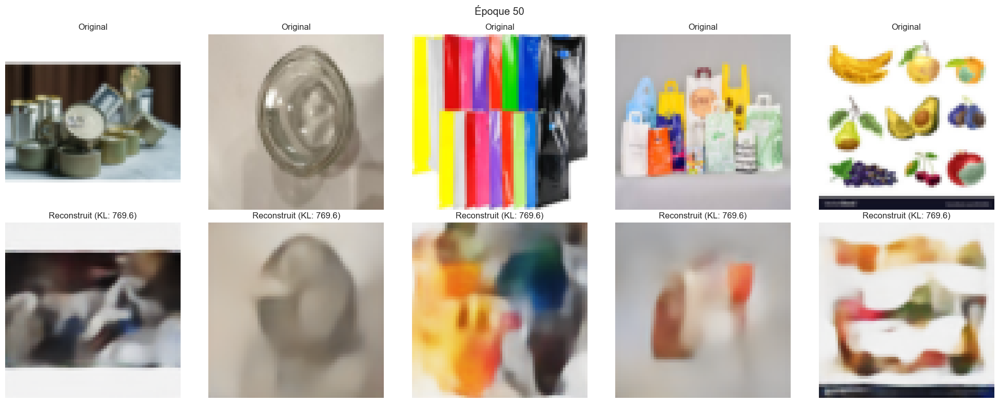

683/683 ━━━━━━━━━━━━━━━━━━━━ 546s 799ms/step - kl_loss: 769.5856 - loss: 6060.3179 - recon_loss: 6052.6206 - val_kl_loss: 769.2513 - val_loss: 6009.0635 - val_recon_loss: 6001.3711 - learning_rate: 1.2500e-04
Epoch 51/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 690ms/step - kl_loss: 771.6210 - loss: 6041.5825 - recon_loss: 6033.8652
Epoch 51: val_recon_loss did not improve from 5977.04346


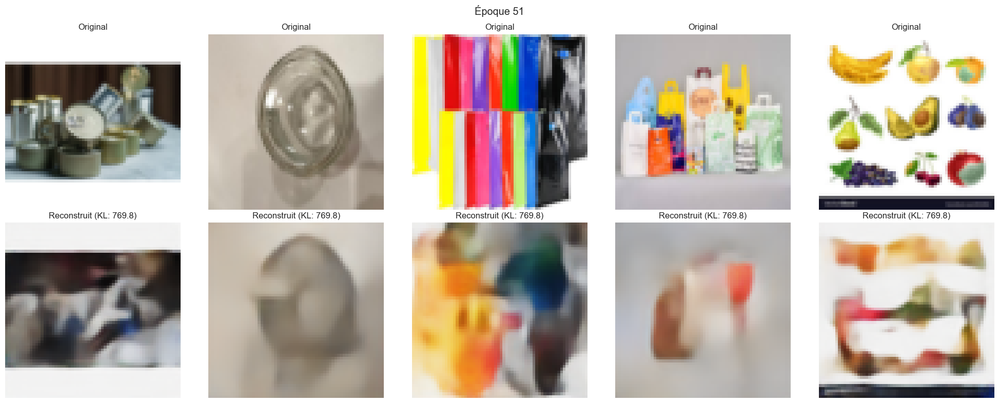

683/683 ━━━━━━━━━━━━━━━━━━━━ 490s 717ms/step - kl_loss: 769.8392 - loss: 6059.9385 - recon_loss: 6052.2393 - val_kl_loss: 768.7819 - val_loss: 6002.2720 - val_recon_loss: 5994.5854 - learning_rate: 1.2500e-04
Epoch 52/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 717ms/step - kl_loss: 771.0080 - loss: 6055.9644 - recon_loss: 6048.2563
Epoch 52: val_recon_loss did not improve from 5977.04346

Epoch 52: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.


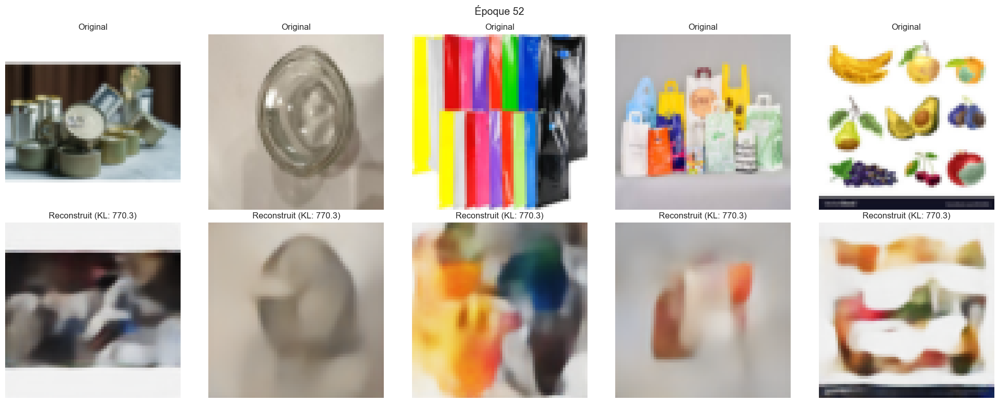

683/683 ━━━━━━━━━━━━━━━━━━━━ 509s 746ms/step - kl_loss: 770.3484 - loss: 6059.2275 - recon_loss: 6051.5269 - val_kl_loss: 772.2829 - val_loss: 6009.8540 - val_recon_loss: 6002.1309 - learning_rate: 1.2500e-04
Epoch 53/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 688ms/step - kl_loss: 772.5920 - loss: 6051.0752 - recon_loss: 6043.3516
Epoch 53: val_recon_loss did not improve from 5977.04346


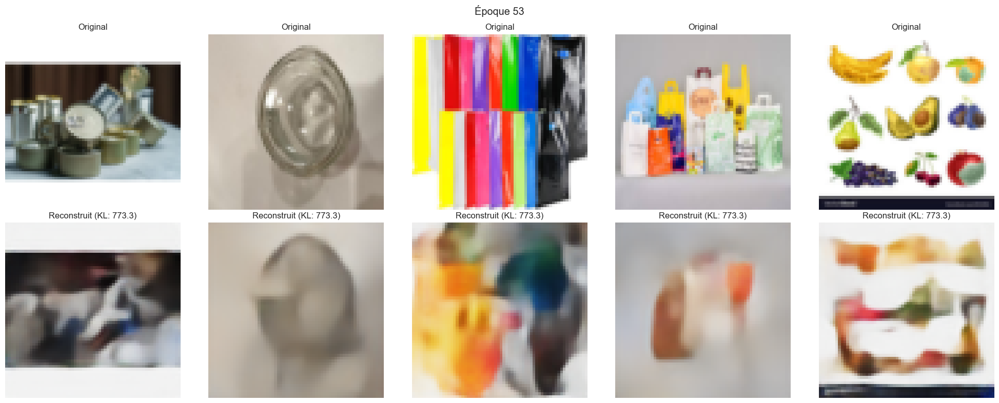

683/683 ━━━━━━━━━━━━━━━━━━━━ 488s 714ms/step - kl_loss: 773.2532 - loss: 6057.7144 - recon_loss: 6049.9863 - val_kl_loss: 777.7706 - val_loss: 6004.0752 - val_recon_loss: 5996.2983 - learning_rate: 6.2500e-05
Epoch 54/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 718ms/step - kl_loss: 776.5462 - loss: 6050.8711 - recon_loss: 6043.1069
Epoch 54: val_recon_loss did not improve from 5977.04346


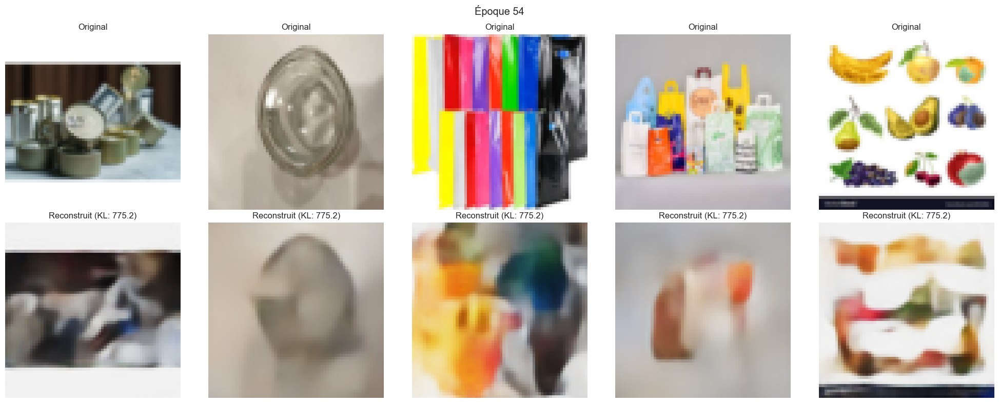

683/683 ━━━━━━━━━━━━━━━━━━━━ 509s 745ms/step - kl_loss: 775.2448 - loss: 6057.2236 - recon_loss: 6049.4722 - val_kl_loss: 775.2416 - val_loss: 6010.3921 - val_recon_loss: 6002.6396 - learning_rate: 6.2500e-05
Epoch 55/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 747ms/step - kl_loss: 775.5164 - loss: 6079.2695 - recon_loss: 6071.5142
Epoch 55: val_recon_loss did not improve from 5977.04346


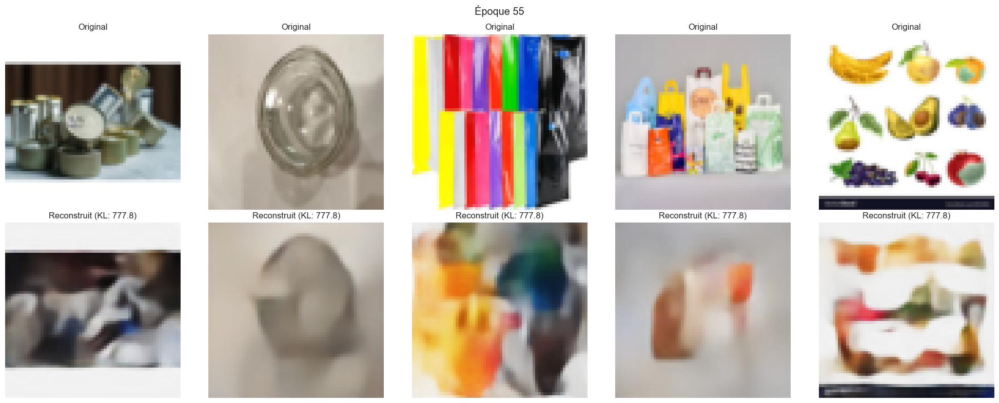

683/683 ━━━━━━━━━━━━━━━━━━━━ 530s 777ms/step - kl_loss: 777.8246 - loss: 6056.7266 - recon_loss: 6048.9468 - val_kl_loss: 774.5284 - val_loss: 6010.5542 - val_recon_loss: 6002.8086 - learning_rate: 6.2500e-05
Epoch 56/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 719ms/step - kl_loss: 776.1598 - loss: 6049.3096 - recon_loss: 6041.5459
Epoch 56: val_recon_loss did not improve from 5977.04346


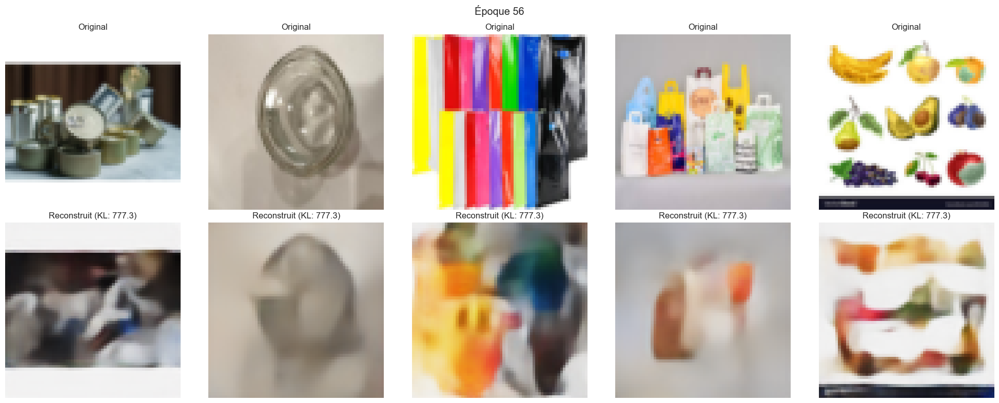

683/683 ━━━━━━━━━━━━━━━━━━━━ 512s 750ms/step - kl_loss: 777.2793 - loss: 6056.5483 - recon_loss: 6048.7715 - val_kl_loss: 778.4139 - val_loss: 6005.1289 - val_recon_loss: 5997.3442 - learning_rate: 6.2500e-05
Epoch 57/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 741ms/step - kl_loss: 779.1141 - loss: 6049.8955 - recon_loss: 6042.1069
Epoch 57: val_recon_loss did not improve from 5977.04346


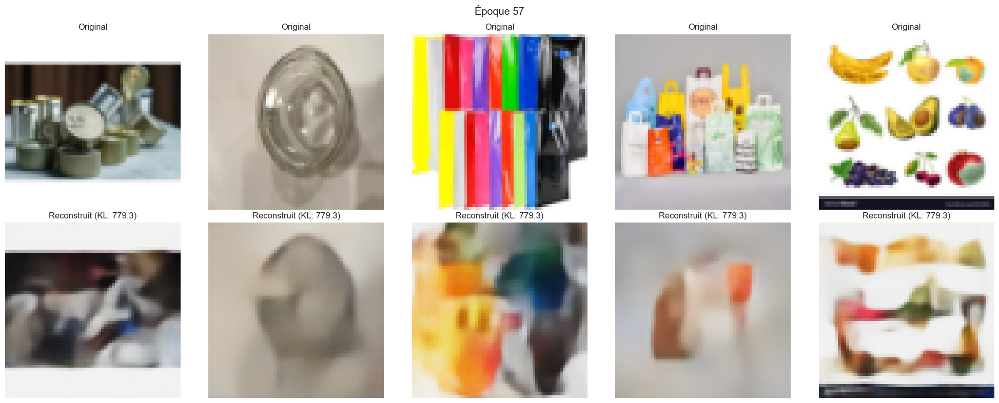

683/683 ━━━━━━━━━━━━━━━━━━━━ 526s 770ms/step - kl_loss: 779.2645 - loss: 6055.9883 - recon_loss: 6048.1938 - val_kl_loss: 780.7096 - val_loss: 6006.6777 - val_recon_loss: 5998.8726 - learning_rate: 6.2500e-05
Epoch 58/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 694ms/step - kl_loss: 780.6520 - loss: 6054.8726 - recon_loss: 6047.0688
Epoch 58: val_recon_loss did not improve from 5977.04346


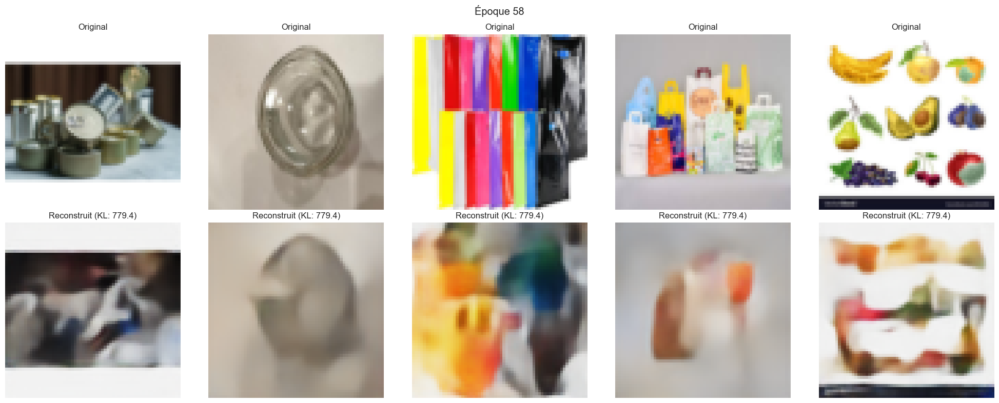

683/683 ━━━━━━━━━━━━━━━━━━━━ 494s 723ms/step - kl_loss: 779.3844 - loss: 6055.5679 - recon_loss: 6047.7783 - val_kl_loss: 783.4234 - val_loss: 6008.4570 - val_recon_loss: 6000.6226 - learning_rate: 6.2500e-05
Epoch 59/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 730ms/step - kl_loss: 780.6931 - loss: 6054.5347 - recon_loss: 6046.7285
Epoch 59: val_recon_loss did not improve from 5977.04346


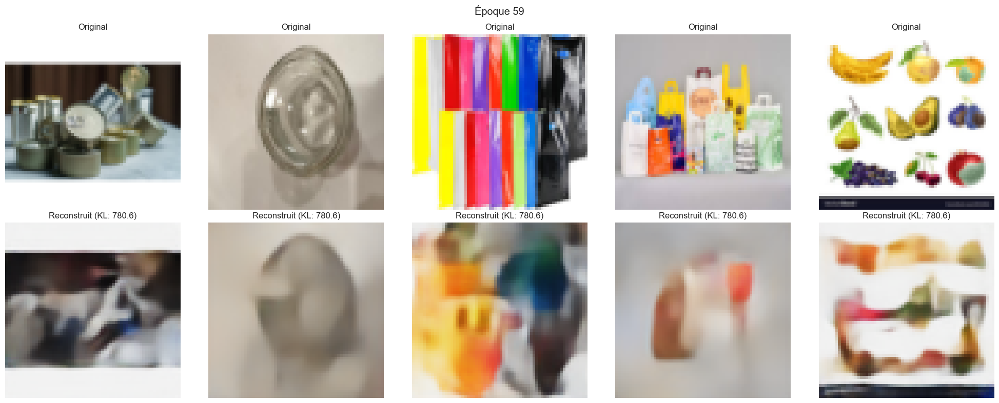

683/683 ━━━━━━━━━━━━━━━━━━━━ 518s 759ms/step - kl_loss: 780.6395 - loss: 6055.8867 - recon_loss: 6048.0830 - val_kl_loss: 780.4227 - val_loss: 6004.7202 - val_recon_loss: 5996.9165 - learning_rate: 6.2500e-05
Epoch 60/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 729ms/step - kl_loss: 778.7410 - loss: 6091.1309 - recon_loss: 6083.3442
Epoch 60: val_recon_loss did not improve from 5977.04346


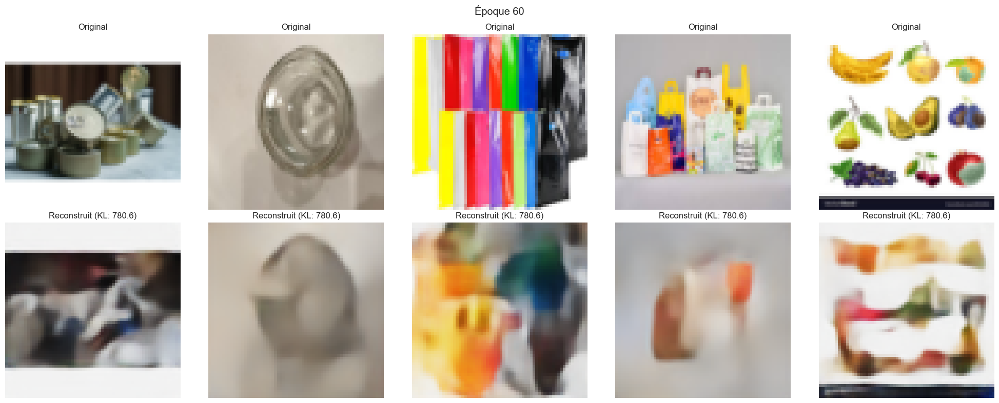

683/683 ━━━━━━━━━━━━━━━━━━━━ 518s 758ms/step - kl_loss: 780.5610 - loss: 6056.5479 - recon_loss: 6048.7446 - val_kl_loss: 782.7955 - val_loss: 6005.2876 - val_recon_loss: 5997.4604 - learning_rate: 6.2500e-05
Epoch 61/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 785ms/step - kl_loss: 783.6976 - loss: 6062.4229 - recon_loss: 6054.5864
Epoch 61: val_recon_loss did not improve from 5977.04346


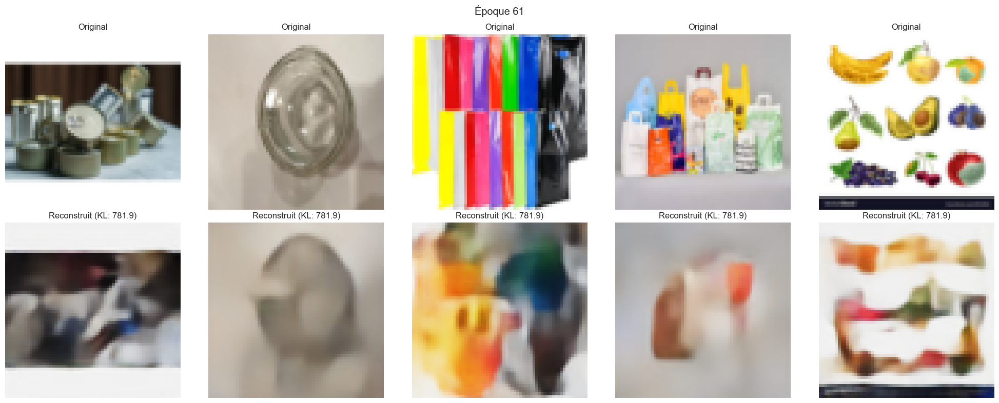

683/683 ━━━━━━━━━━━━━━━━━━━━ 558s 817ms/step - kl_loss: 781.9443 - loss: 6055.8247 - recon_loss: 6048.0039 - val_kl_loss: 783.0545 - val_loss: 6010.8931 - val_recon_loss: 6003.0640 - learning_rate: 6.2500e-05
Epoch 62/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 854ms/step - kl_loss: 783.2446 - loss: 6066.5903 - recon_loss: 6058.7588
Epoch 62: val_recon_loss did not improve from 5977.04346

Epoch 62: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.


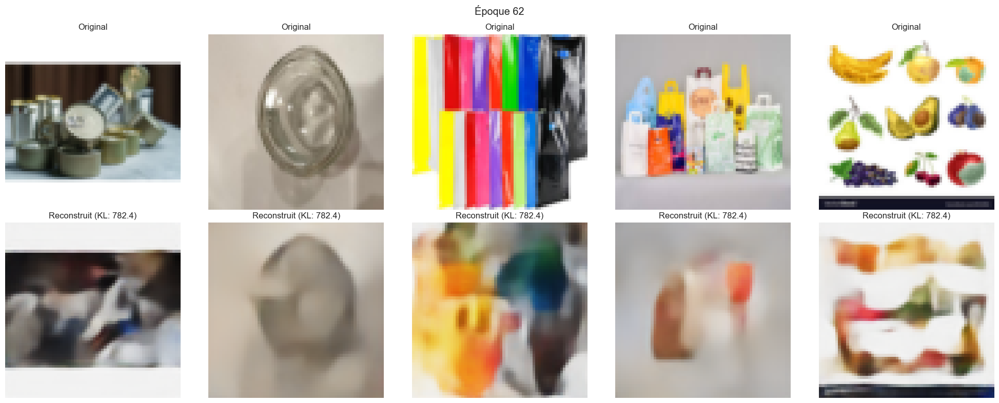

683/683 ━━━━━━━━━━━━━━━━━━━━ 608s 891ms/step - kl_loss: 782.3607 - loss: 6056.0942 - recon_loss: 6048.2700 - val_kl_loss: 786.3724 - val_loss: 6009.4961 - val_recon_loss: 6001.6318 - learning_rate: 6.2500e-05
Epoch 63/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 831ms/step - kl_loss: 783.8275 - loss: 6044.3896 - recon_loss: 6036.5498
Epoch 63: val_recon_loss did not improve from 5977.04346


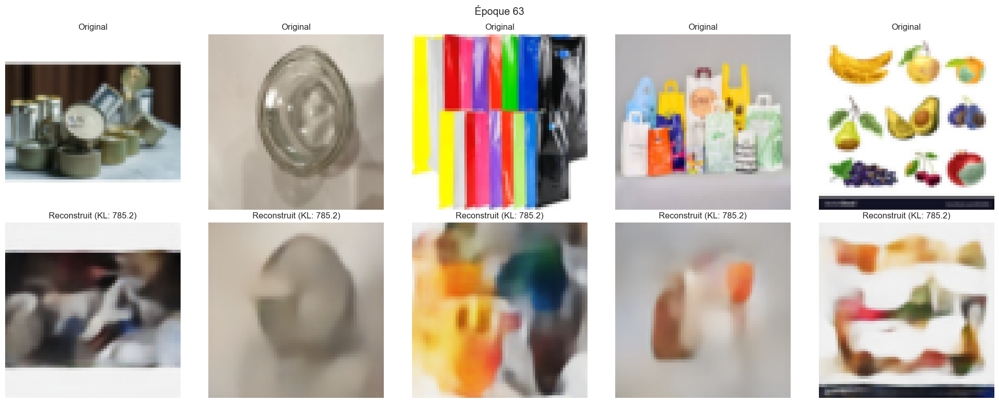

683/683 ━━━━━━━━━━━━━━━━━━━━ 591s 865ms/step - kl_loss: 785.2339 - loss: 6054.8726 - recon_loss: 6047.0195 - val_kl_loss: 785.2463 - val_loss: 6011.2524 - val_recon_loss: 6003.4023 - learning_rate: 3.1250e-05
Epoch 64/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 839ms/step - kl_loss: 786.2101 - loss: 6071.2715 - recon_loss: 6063.4106
Epoch 64: val_recon_loss did not improve from 5977.04346


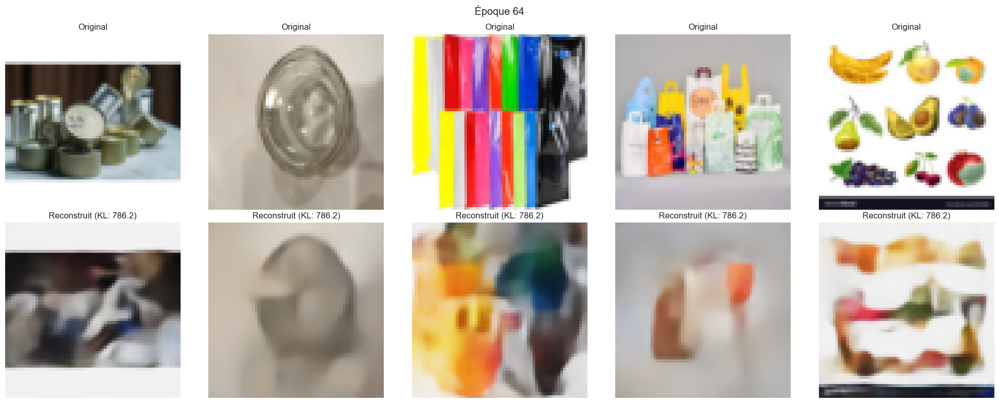

683/683 ━━━━━━━━━━━━━━━━━━━━ 600s 879ms/step - kl_loss: 786.1983 - loss: 6054.2485 - recon_loss: 6046.3892 - val_kl_loss: 784.9563 - val_loss: 6009.1606 - val_recon_loss: 6001.3110 - learning_rate: 3.1250e-05
Epoch 65/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 840ms/step - kl_loss: 786.2430 - loss: 6069.3931 - recon_loss: 6061.5283
Epoch 65: val_recon_loss did not improve from 5977.04346


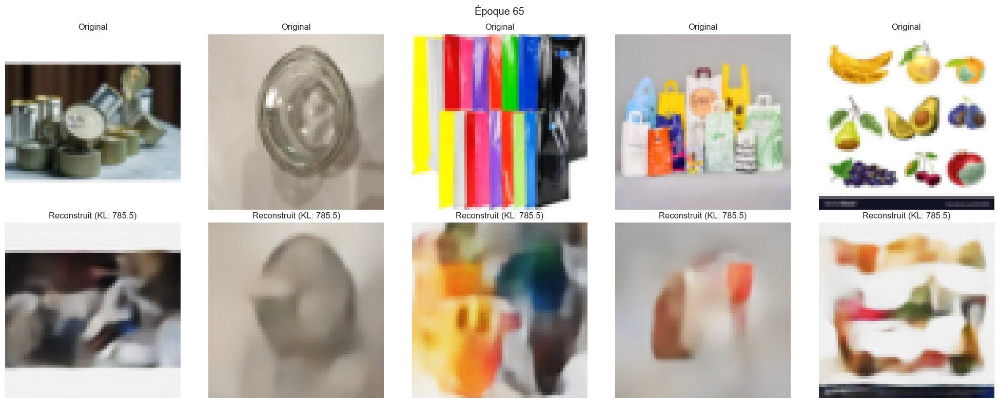

683/683 ━━━━━━━━━━━━━━━━━━━━ 598s 875ms/step - kl_loss: 785.5447 - loss: 6054.3726 - recon_loss: 6046.5151 - val_kl_loss: 783.8826 - val_loss: 6012.1519 - val_recon_loss: 6004.3120 - learning_rate: 3.1250e-05
Epoch 66/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 761ms/step - kl_loss: 784.6584 - loss: 6049.5615 - recon_loss: 6041.7158
Epoch 66: val_recon_loss did not improve from 5977.04346


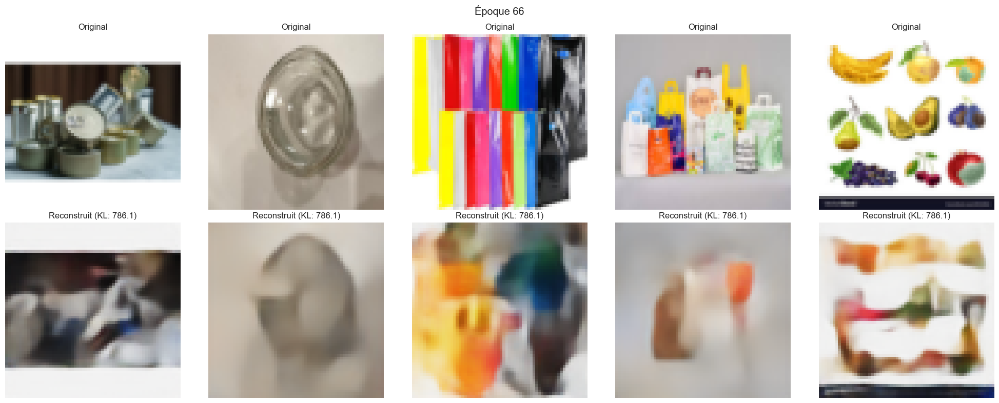

683/683 ━━━━━━━━━━━━━━━━━━━━ 543s 795ms/step - kl_loss: 786.0991 - loss: 6054.7856 - recon_loss: 6046.9272 - val_kl_loss: 786.6601 - val_loss: 6008.6826 - val_recon_loss: 6000.8145 - learning_rate: 3.1250e-05
Epoch 67/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 775ms/step - kl_loss: 785.8539 - loss: 6044.6719 - recon_loss: 6036.8125
Epoch 67: val_recon_loss did not improve from 5977.04346


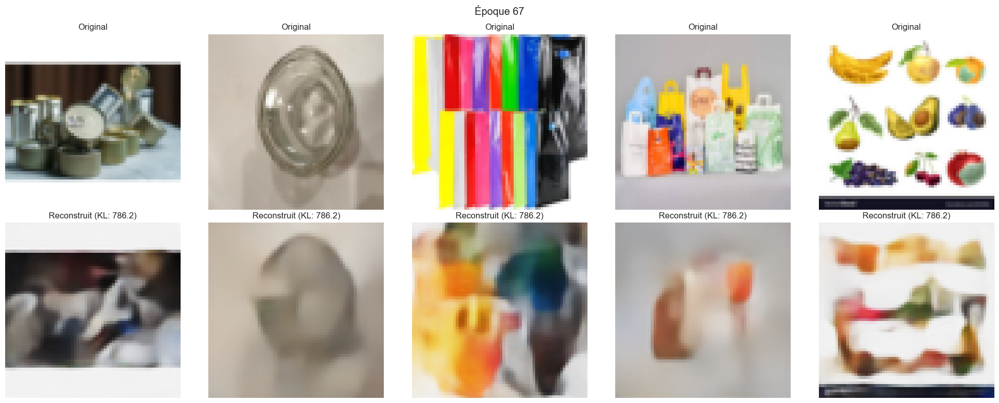

683/683 ━━━━━━━━━━━━━━━━━━━━ 551s 806ms/step - kl_loss: 786.2285 - loss: 6053.8398 - recon_loss: 6045.9746 - val_kl_loss: 786.9299 - val_loss: 6009.8057 - val_recon_loss: 6001.9355 - learning_rate: 3.1250e-05
Epoch 68/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 695ms/step - kl_loss: 786.5949 - loss: 6041.5132 - recon_loss: 6033.6489
Epoch 68: val_recon_loss did not improve from 5977.04346


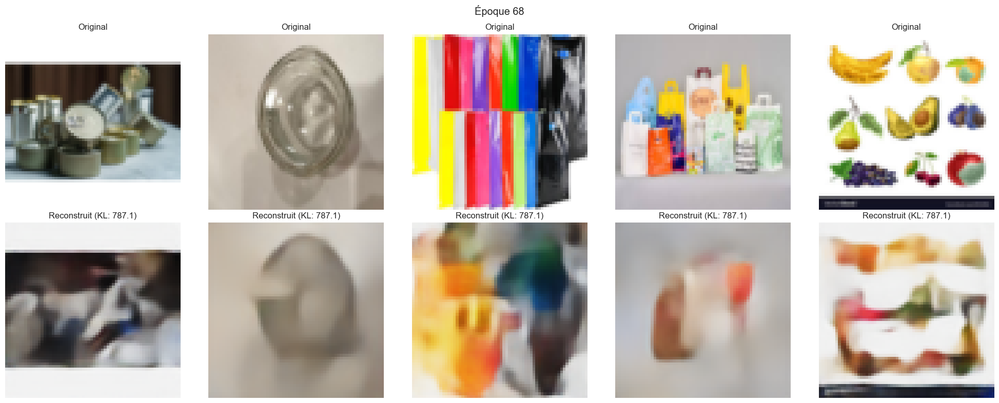

683/683 ━━━━━━━━━━━━━━━━━━━━ 494s 723ms/step - kl_loss: 787.0703 - loss: 6054.6318 - recon_loss: 6046.7607 - val_kl_loss: 785.9026 - val_loss: 6011.0981 - val_recon_loss: 6003.2388 - learning_rate: 3.1250e-05
Epoch 69/100
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 686ms/step - kl_loss: 786.7635 - loss: 6052.0234 - recon_loss: 6044.1553
Epoch 69: val_recon_loss did not improve from 5977.04346


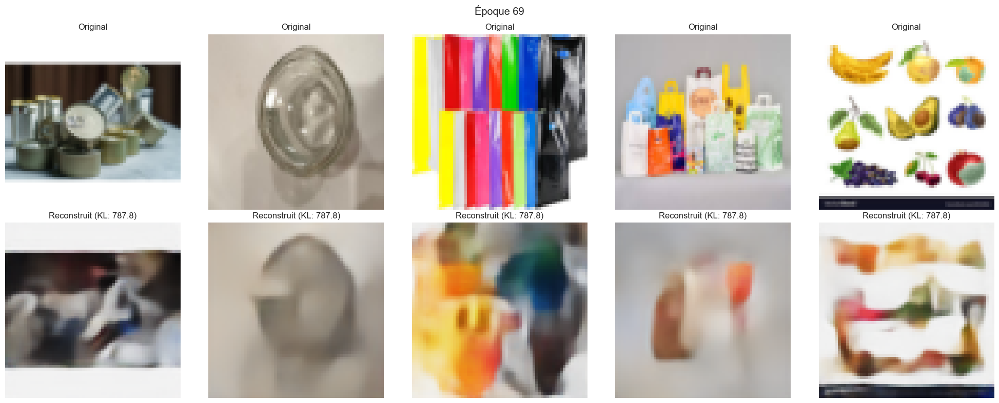

683/683 ━━━━━━━━━━━━━━━━━━━━ 486s 712ms/step - kl_loss: 787.7887 - loss: 6053.9609 - recon_loss: 6046.0840 - val_kl_loss: 788.3618 - val_loss: 6013.5093 - val_recon_loss: 6005.6265 - learning_rate: 3.1250e-05
Epoch 70/100
223/683 ━━━━━━━━━━━━━━━━━━━━ 5:19 695ms/step - kl_loss: 787.4576 - loss: 6054.2881 - recon_loss: 6046.4141

KeyboardInterrupt: 

In [25]:
# Compiler et entraîner le modèle avec visualisation
import time
start_time = time.time()
history = autoencoder.train(
    x_train = X_train,
    x_val = X_test, 
    batch_size=16,
    #epochs=100,
    x_vis=X_vis,
    epochs = start_epoch + 50,
    initial_epoch=start_epoch,
    save_path="model_dct_9.keras"
)
end_time = time.time()
#days, rem = divmod(elapsed, 86400)          
#hours, rem = divmod(rem, 3600)
#minutes, seconds = divmod(rem, 60)

#print(f"Temps d'entraînement : {int(days)}j {int(hours):02d}h {int(minutes):02d}m {int(seconds):02d}s")

autoencoder.save("model_dct_9.keras")
plot_result(history,name_fig="outo-loss",register=True)

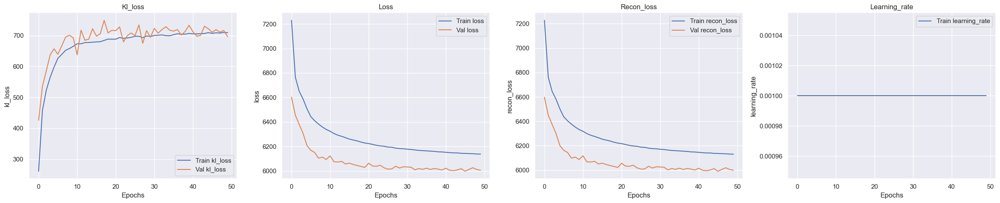

In [23]:
plot_result(history,name_fig="outo-loss",register=True)

In [ ]:
model1 = load_model("model_dct_6.keras", custom_objects={"ResidualVAE": ResidualVAE, "Sampling": Sampling})

In [ ]:
path = "C:/Users/hp/Pictures/Saved Pictures/im1.jpg"

In [ ]:
tf.keras.utils.plot_model(model1, show_shapes=True, show_layer_names=False, dpi=120)

In [ ]:
img,_ = outils.prepare_image(img_path=path,target_size=240)

In [54]:
img = X_train[1:20]

In [55]:
encoded_imgs,g,z = autoencoder.encoder(img)

In [56]:
pred = autoencoder.decoder(z)

In [ ]:
autoencoder.save('model_dct_1.keras')

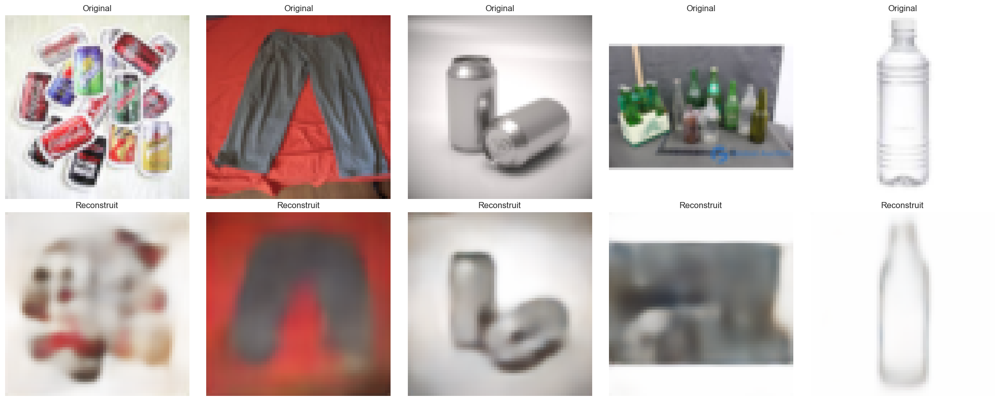

In [57]:
n = 5
plt.figure(figsize=(20, 8))
for i in range(n):
    plt.subplot(2, n, i + 1)
    plt.imshow(np.clip(img[i], 0, 1))
    plt.axis("off")
    plt.title("Original")

    plt.subplot(2, n, n + i + 1)
    plt.imshow(np.clip(pred[i], 0, 1))
    plt.axis("off")
    plt.title("Reconstruit")
plt.savefig("test_auto.png")
plt.tight_layout()
plt.show()


In [22]:
df_anomalie = outils.Load_data.load_object("detect_anomalie.zip")

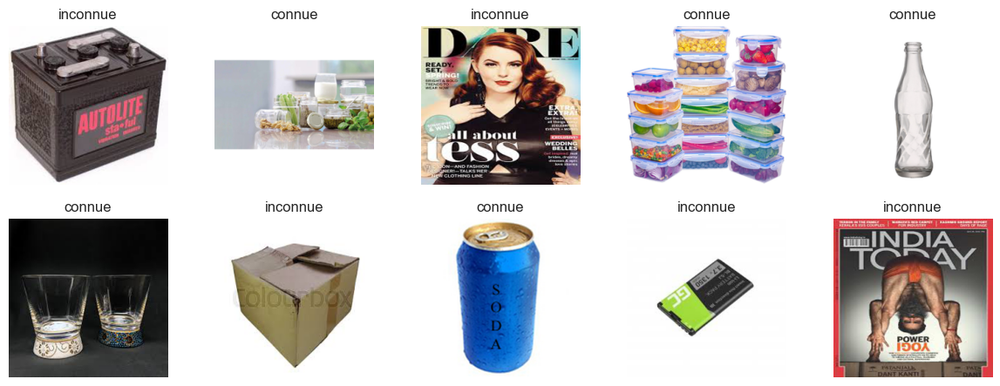

In [23]:
df_anomalie.plot(view_code=True)

In [24]:
df_anomalie.encodage()

In [29]:
df_anomalie.reshape(target_shape=(64,64,3), batch_size = 32)

Reshape en batch: 100%|██████████████████████████████████████████████████████████████| 125/125 [00:05<00:00, 21.43it/s]


In [30]:
(X_test_an, y_test_an), (_,_) = df_anomalie.create_data(test_size=0.0000000000001)

In [26]:
np.unique(y_test_an,return_counts=True)

(array([0, 1], dtype=int32), array([1999, 2000]))

In [48]:
(X_test_an, y_test_an), (_,_) = df_anomalie.create_data(test_size=0.0000000000001)

In [49]:
X_test_an = X_test_an.astype('float32') / 255.

In [45]:
encoded_imgs,g,z = model1.encoder(np.expand_dims(X_test_an[9]/255, axis = 0))
recon = model1.decoder(z)

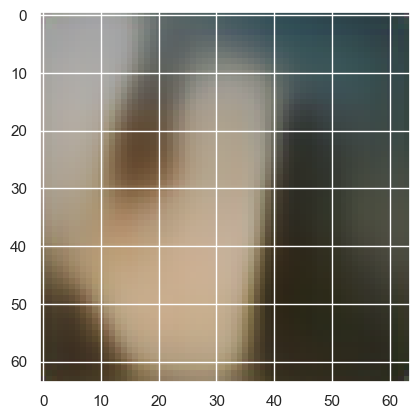

In [46]:
plt.imshow(recon[0])

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.metrics import (
    confusion_matrix, roc_curve,
    precision_recall_curve, classification_report, roc_auc_score
)
import seaborn as sns
import pandas as pd

def detect_anomalies_complete_v2(autoencoder, x_data, y_true, thresholds, batch_size=32):
    """
    Détection d'anomalies complète avec visualisations et rapport détaillé.
    - Calcule les erreurs de reconstruction de manière itérative (optimisée pour faible RAM)
    - Évalue les performances selon plusieurs seuils
    - Trace les courbes des métriques + du nombre d’anomalies détectées
    - Affiche la matrice de confusion (en %) avec labels 'Normal' et 'Anormal'
    - Affiche un rapport global de classification
    """

    # ---------------------------
    # Étape 1 : Calcul des erreurs
    # ---------------------------
    print("Calcul des erreurs de reconstruction...")
    n = len(x_data)
    errors = []
    for i in tqdm(range(0, n, batch_size)):
        batch = x_data[i:i + batch_size]
        encoded_imgs,g,z = autoencoder.encoder(batch)
        recon = autoencoder.decoder(z)
        batch_errors = np.mean(np.square(batch - recon), axis=(1, 2, 3))
        errors.extend(batch_errors)
    errors = np.array(errors)

    # ---------------------------
    # Étape 2 : Histogramme des erreurs
    # ---------------------------
    plt.figure(figsize=(8, 5))
    plt.hist(errors[y_true == 0], bins=40, alpha=0.7, label="Normales")
    plt.hist(errors[y_true == 1], bins=40, alpha=0.7, label="Anomalies")
    plt.xlabel("Erreur de reconstruction")
    plt.ylabel("Fréquence")
    plt.title("Distribution des erreurs de reconstruction")
    plt.legend()
    plt.grid(True)
    plt.show()

    # ---------------------------
    # Étape 3 : Calcul des métriques pour chaque seuil
    # ---------------------------
    results = {}
    n_normals_detected, n_anomalies_detected = [], []

    for t in thresholds:
        y_pred = (errors > t).astype(int)
        cm = confusion_matrix(y_true, y_pred)
        tn, fp, fn, tp = cm.ravel()

        acc = (tp + tn) / (tp + tn + fp + fn + 1e-8)
        prec = tp / (tp + fp + 1e-8)
        rec = tp / (tp + fn + 1e-8)
        f1 = 2 * prec * rec / (prec + rec + 1e-8)
        results[t] = {"accuracy": acc, "precision": prec, "recall": rec, "f1": f1}

        n_normals_detected.append((y_pred == 0).sum())
        n_anomalies_detected.append((y_pred == 1).sum())

    # Convertir en DataFrame pour analyse
    df_metrics = pd.DataFrame(results).T
    df_metrics["anomalies_detected"] = n_anomalies_detected
    df_metrics["normals_detected"] = n_normals_detected

    # ---------------------------
    # Étape 4 : Tracer les métriques et détections
    # ---------------------------
    fig, axes = plt.subplots(1, 2, figsize=(16,6))

    # (a) Nombre de détections
    axes[0].plot(thresholds, df_metrics["normals_detected"], label="Normales détectées")
    axes[0].plot(thresholds, df_metrics["anomalies_detected"], label="Anomalies détectées")
    axes[0].set_title("Évolution du nombre de détections")
    axes[0].set_xlabel("Seuil d'anomalie")
    axes[0].set_ylabel("Nombre d'échantillons")
    axes[0].legend()
    axes[0].grid(True)
    
    # (b) Évolution des métriques
    axes[1].plot(thresholds, df_metrics["accuracy"], label="Exactitude")
    axes[1].plot(thresholds, df_metrics["precision"], label="Précision")
    axes[1].plot(thresholds, df_metrics["recall"], label="Rappel")
    axes[1].plot(thresholds, df_metrics["f1"], label="F1-score")
    axes[1].set_title("Évolution des métriques selon le seuil")
    axes[1].set_xlabel("Seuil d'anomalie")
    axes[1].set_ylabel("Valeur métrique")
    axes[1].legend()
    axes[1].grid(True)

    plt.savefig("auto_metrix.png")
    plt.tight_layout()
    plt.show()

    # ---------------------------
    # Étape 5 : Courbes ROC et PR
    # ---------------------------
    fpr, tpr, _ = roc_curve(y_true, errors)
    precision, recall, _ = precision_recall_curve(y_true, errors)
    auc_score = roc_auc_score(y_true, errors)

    plt.figure(figsize=(16, 6))
    plt.subplot(1, 2, 1)
    plt.plot(fpr, tpr, label=f"AUC = {auc_score:.3f}")
    plt.xlabel("Taux de faux positifs (FPR)")
    plt.ylabel("Taux de vrais positifs (TPR)")
    plt.title("Courbe ROC")
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(recall, precision)
    plt.xlabel("Rappel")
    plt.ylabel("Précision")
    plt.title("Courbe Précision-Rappel")
    plt.grid(True)
    plt.show()

    # ---------------------------
    # Étape 6 : Seuil optimal + rapport complet
    # ---------------------------
    best_t = df_metrics["f1"].idxmax()
    print(f"\n Seuil optimal (F1 max) = {best_t:.5f}\n")
    print("Métriques associées :")
    print(df_metrics.loc[best_t].to_string(), "\n")

    y_pred_best = (errors > best_t).astype(int)

    # Matrice de confusion (avec labels et pourcentages)
    cm_best = confusion_matrix(y_true, y_pred_best)
    cm_percent = cm_best.astype('float') / cm_best.sum(axis=1)[:, np.newaxis]

    labels = ["Normal", "Anormal"]
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm_percent, annot=True, fmt=".2%", cmap="Blues", cbar=False,
                xticklabels=labels, yticklabels=labels)
    plt.xlabel("Prédiction")
    plt.ylabel("Vérité terrain")
    plt.title("Matrice de confusion - Seuil optimal")
    plt.savefig("matrix_auto.png")
    plt.show()

    print("Rapport de classification :")
    print(classification_report(y_true, y_pred_best, target_names=labels, digits=3))

    return errors, df_metrics, best_t


Calcul des erreurs de reconstruction...


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [01:43<00:00,  2.41it/s]


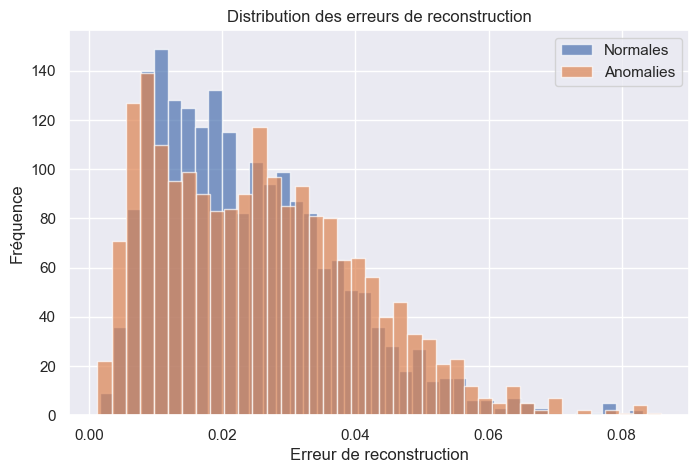

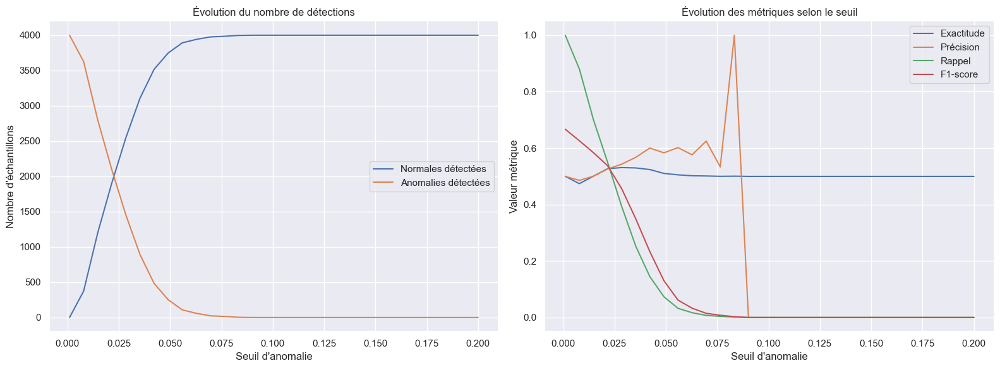

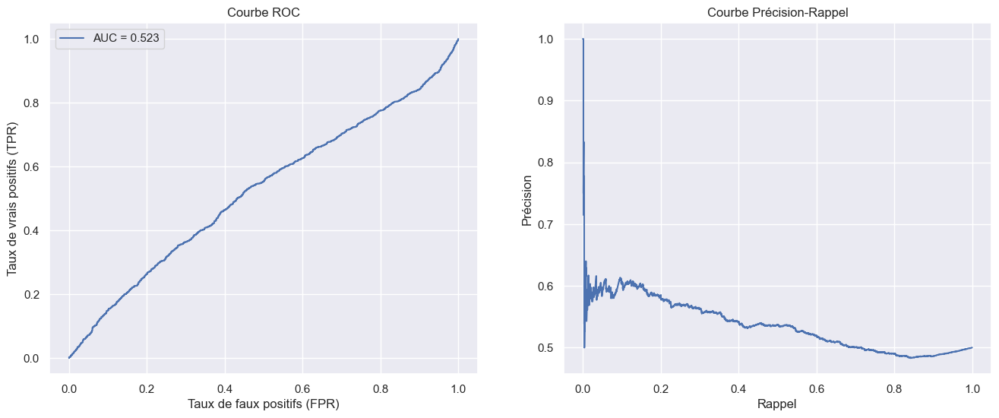


 Seuil optimal (F1 max) = 0.00100

Métriques associées :
accuracy                 0.500125
precision                0.500125
recall                   1.000000
f1                       0.666778
anomalies_detected    3999.000000
normals_detected         0.000000 



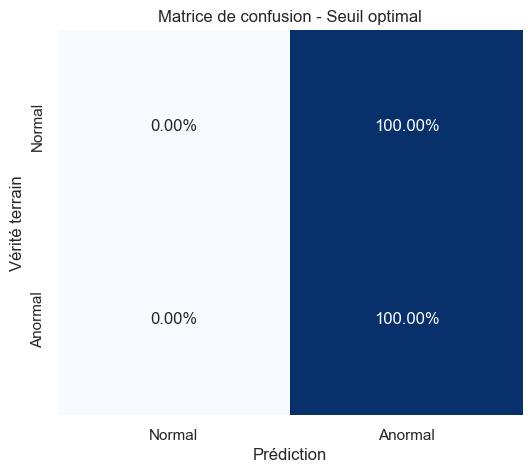

Rapport de classification :
              precision    recall  f1-score   support

      Normal      0.000     0.000     0.000      1999
     Anormal      0.500     1.000     0.667      2000

    accuracy                          0.500      3999
   macro avg      0.250     0.500     0.333      3999
weighted avg      0.250     0.500     0.333      3999



C:\Users\hp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\hp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\hp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

In [51]:
thresholds = np.linspace(0.001, 0.2, 30)
errors, df_metrics, best_t = detect_anomalies_complete_v2(model1, X_test_an, y_test_an, thresholds, batch_size=16)

In [26]:
z_mean, z_logvar, z = autoencoder.encoder.predict(np.expand_dims(X_train[9], axis = 0))
recon = autoencoder.decoder.predict(z)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


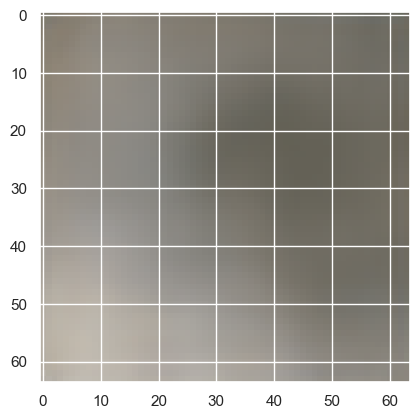

In [27]:
plt.imshow(recon[0])